<a href="https://colab.research.google.com/github/pmukhog/Lung-Disease-Prediction/blob/main/Lung_Disease_Prediction_updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import cv2
import keras
from numpy import random
import tensorflow as tf
import tensorflow_datasets as tfds
from matplotlib import pyplot as plt
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Conv2D
from keras.layers import MaxPooling2D, BatchNormalization
from keras.optimizers import SGD
from keras.utils import to_categorical
from keras.applications import MobileNet, VGG16, ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import classification_report ,confusion_matrix
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import seaborn as sns



import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Directory of train, validation and test

train_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/train"
valid_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/valid"
test_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/test"

In [ ]:
print("\n\n\t\tTraining Set")
print("\t  ========================\n")
train_c = []
for folder in os.listdir(train_folder):
    train_c.append(folder)
    print("\nTrain "+ folder + " Class: ", len(os.listdir(train_folder + '/' + folder)))

print("\n\n", train_c)

print("\n\n\t\tTesting Set")
print("\t  ========================\n")
test_c = []
for folder in os.listdir(test_folder):
    test_c.append(folder)
    print("\nTest "+ folder + " Class: ", len(os.listdir(test_folder + '/' + folder)))

print("\n\n", test_c)

print("\n\n\t\tValidation Set")
print("\t  ========================\n")
val_c = []
for folder in os.listdir(valid_folder):
    val_c.append(folder)
    print("\nValidation "+ folder + " Class: ", len(os.listdir(valid_folder + '/' + folder)))

print("\n\n", val_c, "\n")



		Training Set


Train squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa Class:  155

Train large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa Class:  115

Train adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib Class:  195

Train normal Class:  148


 ['squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa', 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa', 'adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib', 'normal']


		Testing Set


Test normal Class:  54

Test squamous.cell.carcinoma Class:  90

Test adenocarcinoma Class:  120

Test large.cell.carcinoma Class:  51


 ['normal', 'squamous.cell.carcinoma', 'adenocarcinoma', 'large.cell.carcinoma']


		Validation Set


Validation adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib Class:  23

Validation squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa Class:  15

Validation large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa Class:  21

Validation normal Class:  13


 ['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib', 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa', 'larg

In [ ]:
input_shape = (224,224,3)
num_class = 4

train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function=preprocess_input,
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=False
)
val_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function=preprocess_input,
)
test_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function=preprocess_input,
)

train_generator = train_datagen.flow_from_directory(
    train_folder,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical',
)


test_generator = test_datagen.flow_from_directory(
    test_folder,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical',
    shuffle = False,
)
validation_generator = val_datagen.flow_from_directory(
    valid_folder,
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical',
)

Found 613 images belonging to 4 classes.
Found 315 images belonging to 4 classes.
Found 72 images belonging to 4 classes.


# VGG16


In [ ]:
modelVGG16 = VGG16(weights = 'imagenet',
                     include_top = False,
                     input_shape = input_shape)

for layer in modelVGG16.layers:
    layer.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    modelVGG16,
    BatchNormalization(),
    MaxPooling2D(pool_size = (2,2)),
    Dropout(.3),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dropout(.3),
    Dense(512, activation = 'relu'),
    Dropout(.3),
    Dense(256, activation = 'relu'),
    Dropout(.3),
    Dense(num_class, activation = 'softmax')
])


print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 batch_normalization (Batch  (None, 7, 7, 512)         2048      
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 3, 3, 512)         0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 3, 3, 512)         0         
                                                                 
 flatten (Flatten)           (None, 4608)              0         
                                                                 
 dense (Dense)               (None, 1024)              4

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate = 0.001)
opt1 = tf.keras.optimizers.RMSprop(learning_rate = 0.001)

model.compile(loss = 'categorical_crossentropy',
             optimizer = opt,
             metrics = ['accuracy'])

In [ ]:
#Defining a Checkpoint
checkpoint = ModelCheckpoint(filepath = '/content/drive/MyDrive/Minor_Project/Models/vgg16.h5',
                            monitor = 'val_accuracy',
                            mode = 'max',
                            save_best_only = True,
                            verbose = 1)

#Defining a Early Stopping
earlystop = EarlyStopping(monitor = 'val_accuracy',
                         min_delta = .5,
                         patience = 5,
                         restore_best_weights = True)

#Defining LR Reducing rate
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy',
                             factor = 0.1,
                             patience = 3,
                             verbose = 1,
                             min_delta = 0.8)

#Putting the call backs in a callback list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 200
batch_size = 32

history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    batch_size=batch_size,
    verbose=1,
    callbacks=[checkpoint]
)


test = test_generator
score = model.evaluate(test, verbose=1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])


Epoch 1/200
20/20 [==============================] - ETA: 0s - loss: 2.3623 - accuracy: 0.4095
Epoch 1: val_accuracy improved from -inf to 0.52778, saving model to /content/drive/MyDrive/Minor_Project/Models/vgg16.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 175s 8s/step - loss: 2.3623 - accuracy: 0.4095 - val_loss: 1.5515 - val_accuracy: 0.5278
Epoch 2/200
20/20 [==============================] - ETA: 0s - loss: 1.3491 - accuracy: 0.5073
Epoch 2: val_accuracy improved from 0.52778 to 0.61111, saving model to /content/drive/MyDrive/Minor_Project/Models/vgg16.h5
20/20 [==============================] - 14s 708ms/step - loss: 1.3491 - accuracy: 0.5073 - val_loss: 0.8410 - val_accuracy: 0.6111
Epoch 3/200
20/20 [==============================] - ETA: 0s - loss: 1.0825 - accuracy: 0.5563
Epoch 3: val_accuracy did not improve from 0.61111
20/20 [==============================] - 13s 650ms/step - loss: 1.0825 - accuracy: 0.5563 - val_loss: 1.0134 - val_accuracy: 0.5833
Epoch 4/200
20/20 [==============================] - ETA: 0s - loss: 0.9583 - accuracy: 0.6020
Epoch 4: val_accuracy improved from 0.61111 to 0.62500, saving model to /content/drive/MyDrive/Minor_Project/Models/vgg16.h5
20/20 [=============

In [ ]:
# Save the history for later analysis
import pickle
with open('/content/drive/MyDrive/Minor_Project/Models/vgg16_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 3s 295ms/step
              precision    recall  f1-score   support

           0       0.84      0.93      0.88       120
           1       0.83      0.98      0.90        51
           2       1.00      0.98      0.99        54
           3       1.00      0.76      0.86        90

    accuracy                           0.90       315
   macro avg       0.92      0.91      0.91       315
weighted avg       0.91      0.90      0.90       315





Confusion Matrix:
 [[112   8   0   0]
 [  1  50   0   0]
 [  0   1  53   0]
 [ 21   1   0  68]]


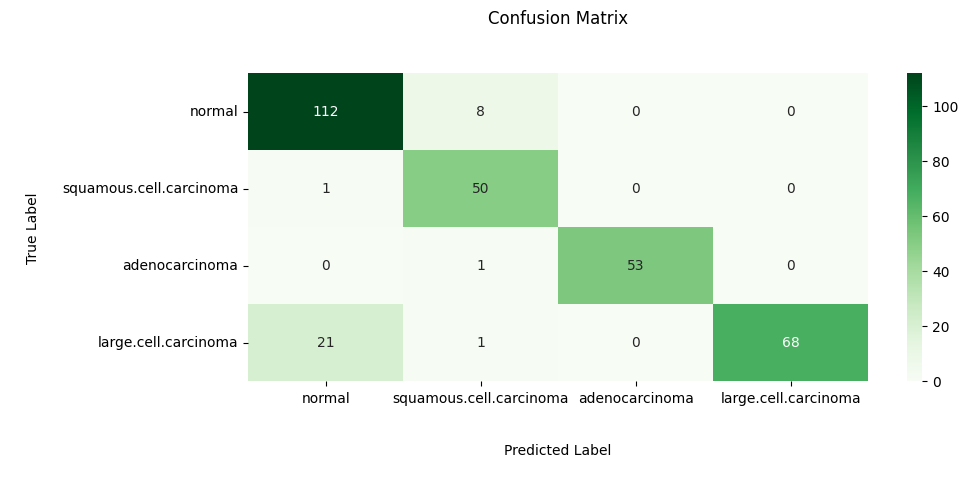

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

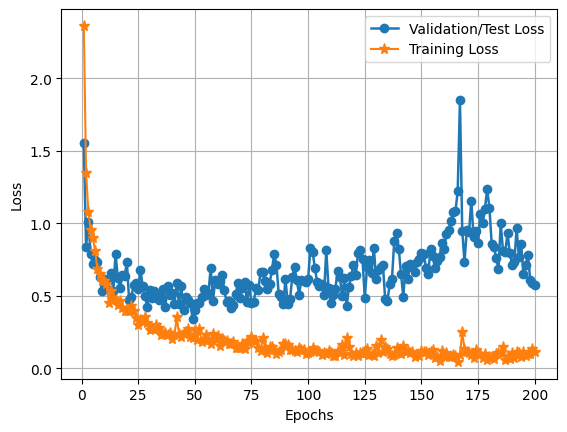

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

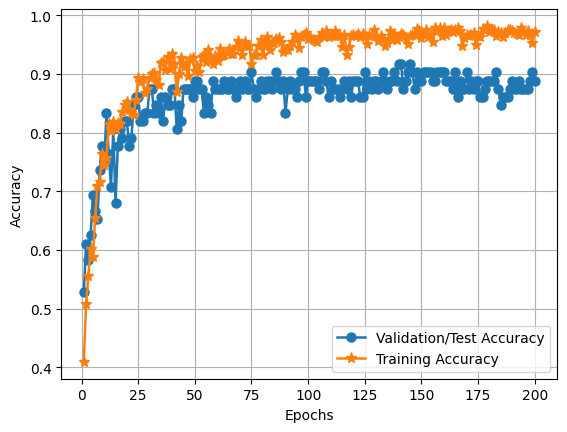

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/vgg16.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 18ms/step


<ipython-input-15-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 18ms/step


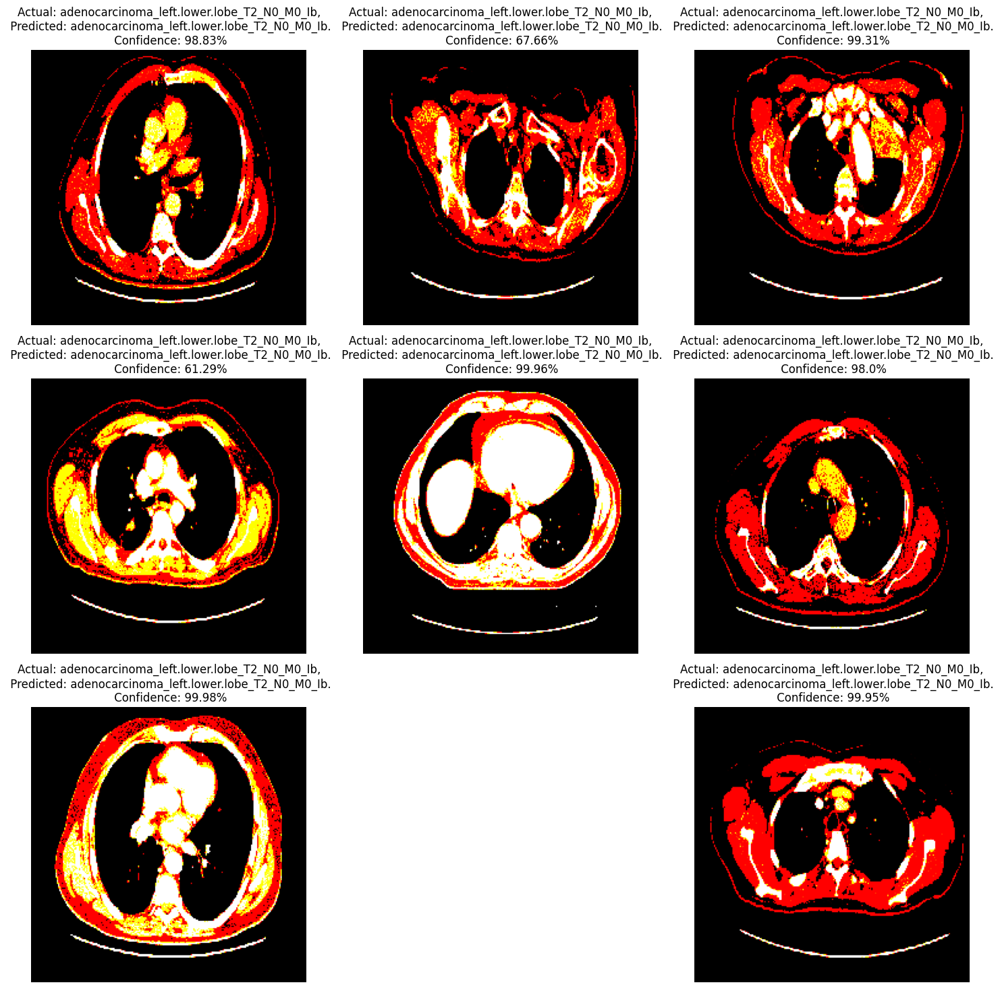

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# VGG19

In [ ]:
from keras.applications import VGG19
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelVGG19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelVGG19.layers:
    layer.trainable = False

80134624/80134624 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    modelVGG19,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 batch_normalization (Batch  (None, 7, 7, 512)         2048      
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 3, 3, 512)         0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 3, 3, 512)         0         
                                                                 
 flatten (Flatten)           (None, 4608)              0         
                                                                 
 dense (Dense)               (None, 1024)              4

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/vgg19.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 100
batch_size = 32  # Choose your desired batch size

history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    batch_size=batch_size,  # Specify the batch size
    verbose=1,
    callbacks=[checkpoint]
)

# Assuming 'test_generator' is defined earlier
test = test_generator
score = model.evaluate(test, verbose=1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/100
20/20 [==============================] - ETA: 0s - loss: 2.4829 - accuracy: 0.3524
Epoch 1: val_accuracy improved from -inf to 0.47222, saving model to /content/drive/MyDrive/Minor_Project/Models/vgg19.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 141s 7s/step - loss: 2.4829 - accuracy: 0.3524 - val_loss: 2.0636 - val_accuracy: 0.4722
Epoch 2/100
20/20 [==============================] - ETA: 0s - loss: 1.3478 - accuracy: 0.5041
Epoch 2: val_accuracy improved from 0.47222 to 0.52778, saving model to /content/drive/MyDrive/Minor_Project/Models/vgg19.h5
20/20 [==============================] - 14s 698ms/step - loss: 1.3478 - accuracy: 0.5041 - val_loss: 0.9507 - val_accuracy: 0.5278
Epoch 3/100
20/20 [==============================] - ETA: 0s - loss: 1.0217 - accuracy: 0.5742
Epoch 3: val_accuracy improved from 0.52778 to 0.62500, saving model to /content/drive/MyDrive/Minor_Project/Models/vgg19.h5
20/20 [==============================] - 13s 629ms/step - loss: 1.0217 - accuracy: 0.5742 - val_loss: 0.8063 - val_accuracy: 0.6250
Epoch 4/100
20/20 [==============================] - ETA: 0s - loss: 0.9352 - accuracy: 0.5824
Epoch 4: val_accuracy did not improve from 0.62500
20/20 [=============

In [ ]:
test = test_generator
score = model.evaluate(test, verbose = 1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

10/10 [==============================] - 7s 702ms/step - loss: 0.4028 - accuracy: 0.9048
Test loss: 0.40278419852256775
Test accuracy: 0.9047619104385376


In [ ]:
# Save the history for later analysis
import pickle
with open('/content/drive/MyDrive/Minor_Project/Models/vgg19_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 6s 592ms/step
              precision    recall  f1-score   support

           0       0.95      0.83      0.89       120
           1       0.81      0.98      0.88        51
           2       1.00      0.98      0.99        54
           3       0.86      0.91      0.89        90

    accuracy                           0.90       315
   macro avg       0.91      0.93      0.91       315
weighted avg       0.91      0.90      0.91       315





Confusion Matrix:
 [[100   8   0  12]
 [  0  50   0   1]
 [  0   1  53   0]
 [  5   3   0  82]]


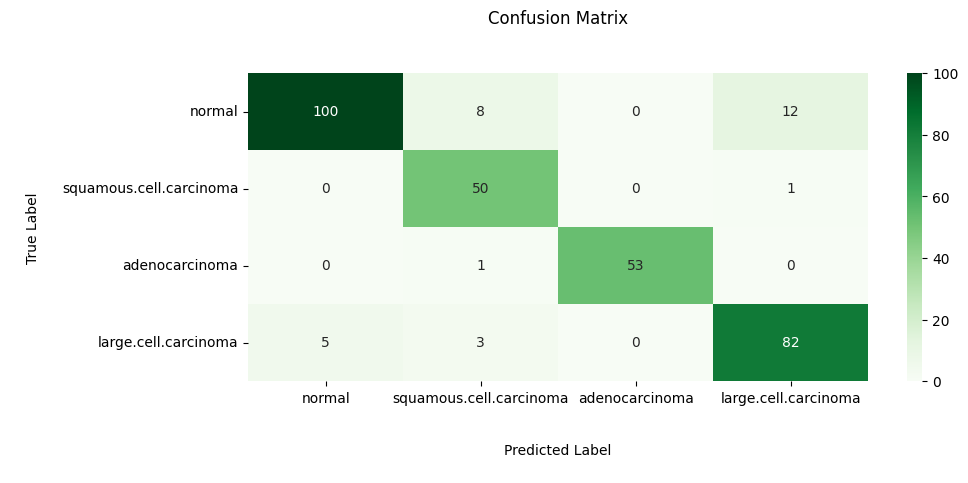

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

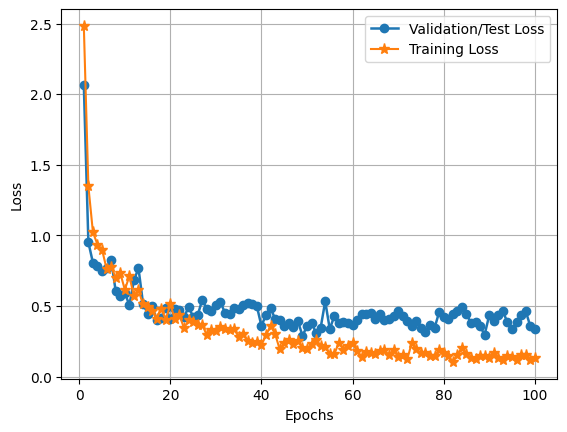

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

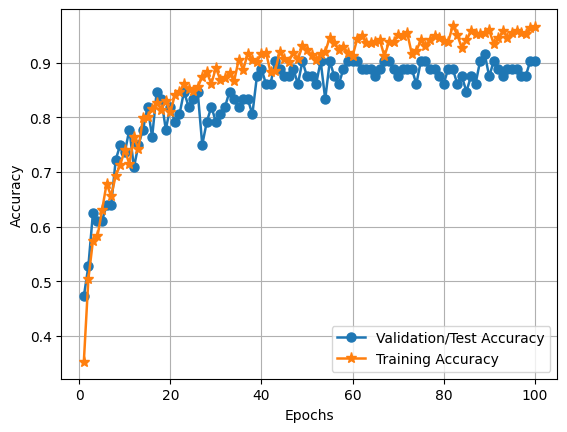

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/vgg19.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 18ms/step


<ipython-input-11-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 18ms/step


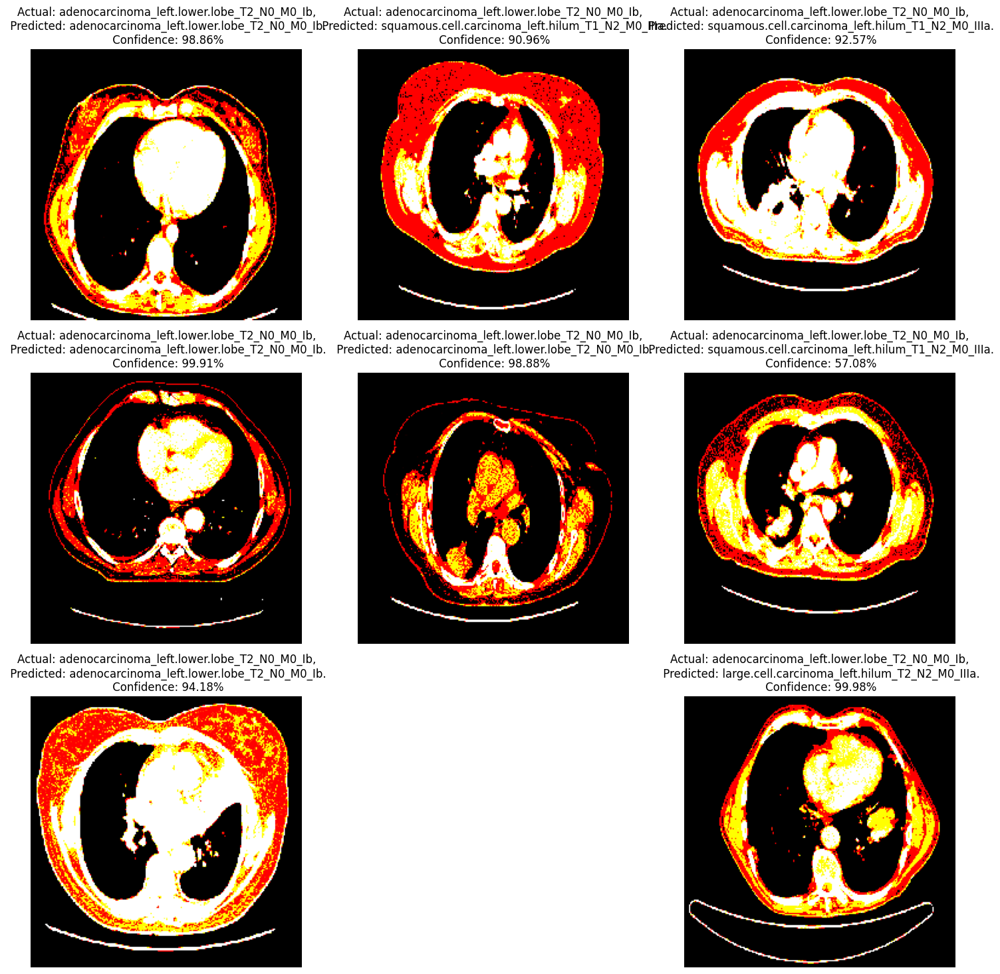

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# ResNet50

In [ ]:
from keras.applications import ResNet50  # Import ResNet50
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelResNet50 = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelResNet50.layers:
    layer.trainable = False

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    modelResNet50,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 batch_normalization_2 (Bat  (None, 7, 7, 2048)        8192      
 chNormalization)                                                
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 3, 3, 2048)        0         
 g2D)                                                            
                                                                 
 dropout_8 (Dropout)         (None, 3, 3, 2048)        0         
                                                                 
 flatten_2 (Flatten)         (None, 18432)             0         
                                                                 
 dense_8 (Dense)             (None, 1024)             

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/resnet50.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)
test = test_generator
score = model.evaluate(test, verbose = 1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 4.5686 - accuracy: 0.3817
Epoch 1: val_accuracy improved from -inf to 0.45833, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet50.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 23s 903ms/step - loss: 4.5686 - accuracy: 0.3817 - val_loss: 1.4932 - val_accuracy: 0.4583
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 2.2225 - accuracy: 0.4682
Epoch 2: val_accuracy did not improve from 0.45833
20/20 [==============================] - 22s 1s/step - loss: 2.2225 - accuracy: 0.4682 - val_loss: 1.0952 - val_accuracy: 0.4444
Epoch 3/50
19/20 [===========================>..] - ETA: 0s - loss: 1.4821 - accuracy: 0.4934
Epoch 3: val_accuracy improved from 0.45833 to 0.48611, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet50.h5
20/20 [==============================] - 21s 1s/step - loss: 1.4793 - accuracy: 0.4943 - val_loss: 1.1395 - val_accuracy: 0.4861
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.1659 - accuracy: 0.5661
Epoch 4: val_accuracy improved from 0.48611 to 0.51389, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet50.h5
20/20 [==============

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 4s 269ms/step
              precision    recall  f1-score   support

           0       0.78      0.92      0.84       120
           1       0.72      0.82      0.77        51
           2       1.00      0.98      0.99        54
           3       0.95      0.67      0.78        90

    accuracy                           0.84       315
   macro avg       0.86      0.85      0.85       315
weighted avg       0.86      0.84      0.84       315





Confusion Matrix:
 [[110   7   0   3]
 [  9  42   0   0]
 [  0   1  53   0]
 [ 22   8   0  60]]


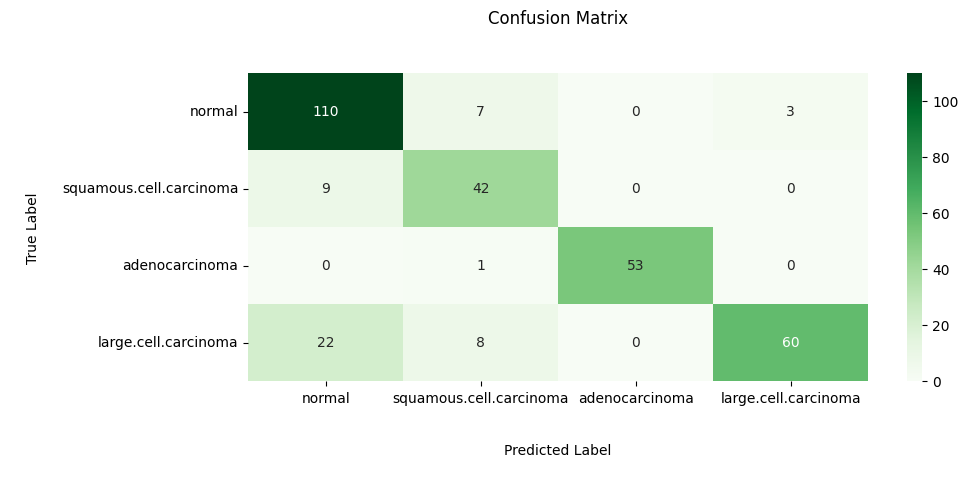

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

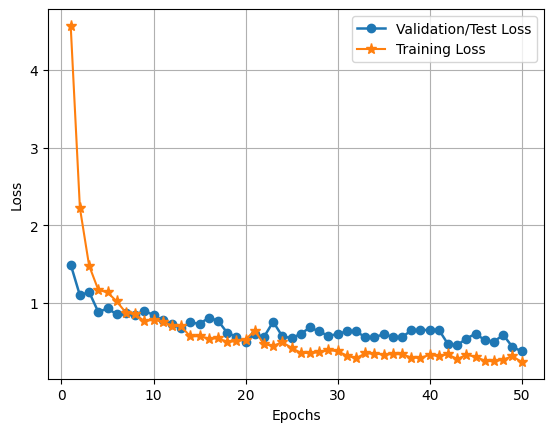

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

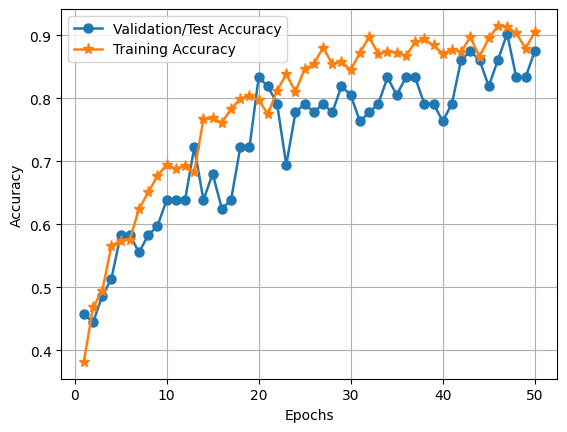

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/resnet50.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 34ms/step


<ipython-input-14-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 52ms/step


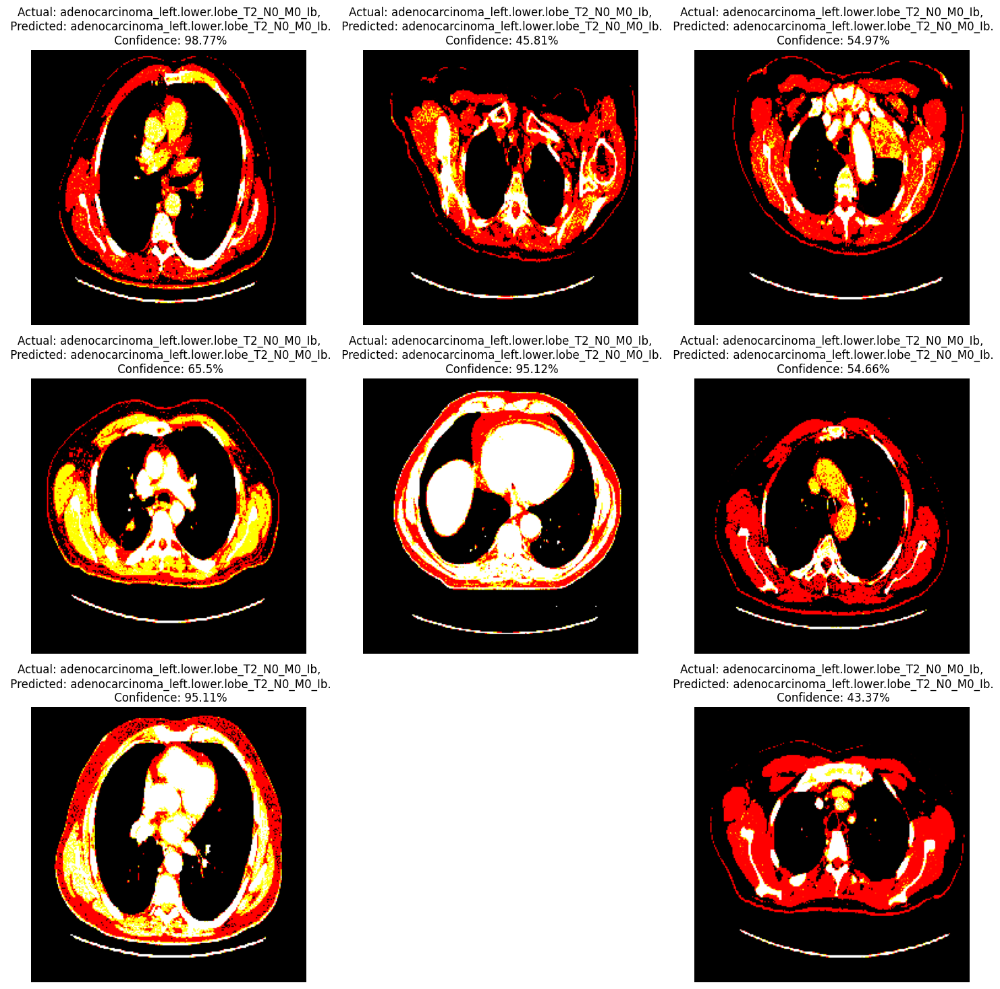

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# ResNet101

In [ ]:
from keras.applications import ResNet101  # Import ResNet101
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelResNet101 = ResNet101(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelResNet101.layers:
    layer.trainable = False

171446536/171446536 [==============================] - 1s 0us/step


In [ ]:
model = Sequential([
    modelResNet101,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 7, 7, 2048)        42658176  
                                                                 
 batch_normalization_3 (Bat  (None, 7, 7, 2048)        8192      
 chNormalization)                                                
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 3, 3, 2048)        0         
 g2D)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 3, 3, 2048)        0         
                                                                 
 flatten_3 (Flatten)         (None, 18432)             0         
                                                                 
 dense_12 (Dense)            (None, 1024)             

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/resnet101.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)
test = test_generator
score = model.evaluate(test, verbose = 1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 4.6600 - accuracy: 0.3899
Epoch 1: val_accuracy improved from -inf to 0.41667, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet101.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 26s 967ms/step - loss: 4.6600 - accuracy: 0.3899 - val_loss: 2.5068 - val_accuracy: 0.4167
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 2.6391 - accuracy: 0.4861
Epoch 2: val_accuracy improved from 0.41667 to 0.54167, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet101.h5
20/20 [==============================] - 17s 815ms/step - loss: 2.6391 - accuracy: 0.4861 - val_loss: 1.2465 - val_accuracy: 0.5417
Epoch 3/50
20/20 [==============================] - ETA: 0s - loss: 1.7555 - accuracy: 0.5400
Epoch 3: val_accuracy did not improve from 0.54167
20/20 [==============================] - 27s 1s/step - loss: 1.7555 - accuracy: 0.5400 - val_loss: 0.9346 - val_accuracy: 0.4861
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.4357 - accuracy: 0.5449
Epoch 4: val_accuracy did not improve from 0.54167
20/20 [==============================] - 20s 944ms/step - loss: 1.4357 - accuracy: 0.5449 - va

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 5s 336ms/step
              precision    recall  f1-score   support

           0       0.77      0.83      0.80       120
           1       0.70      0.82      0.76        51
           2       1.00      0.93      0.96        54
           3       0.81      0.68      0.74        90

    accuracy                           0.80       315
   macro avg       0.82      0.82      0.81       315
weighted avg       0.81      0.80      0.80       315





Confusion Matrix:
 [[100   8   0  12]
 [  7  42   0   2]
 [  4   0  50   0]
 [ 19  10   0  61]]


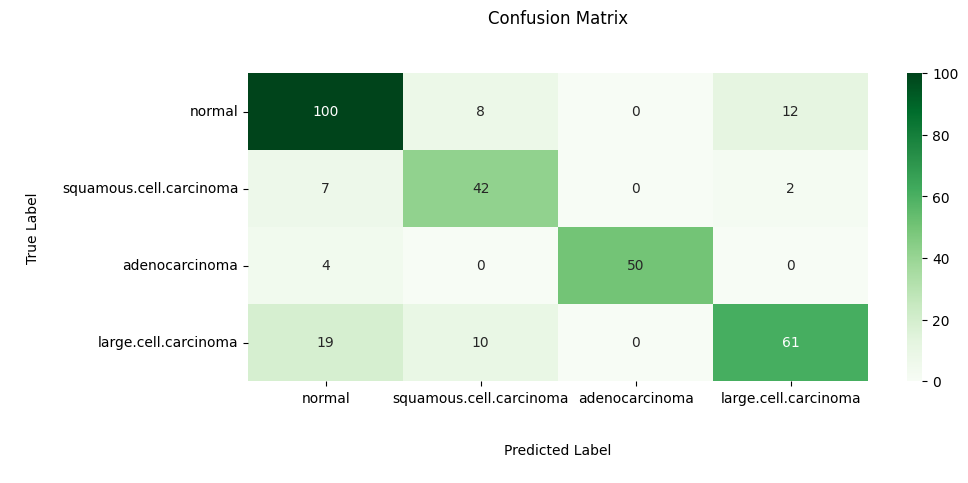

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

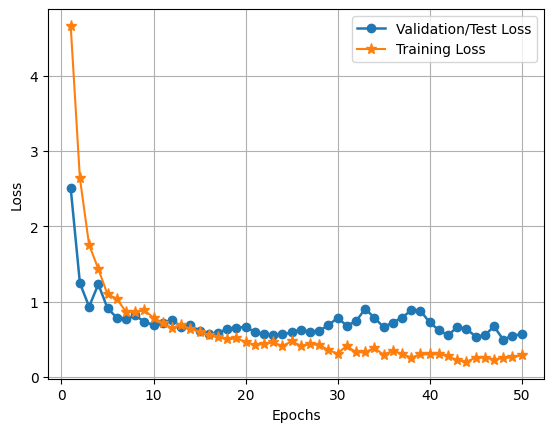

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

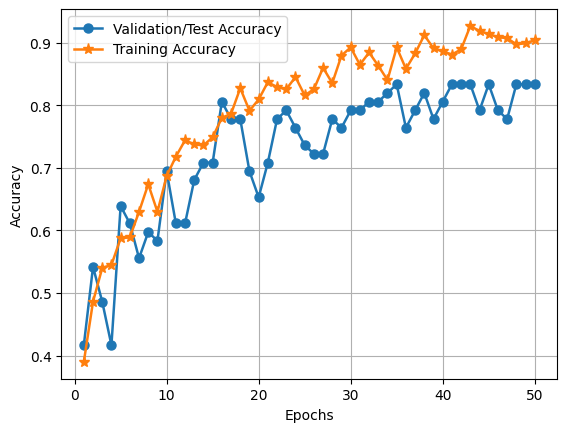

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/resnet101.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 28ms/step


<ipython-input-18-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 28ms/step


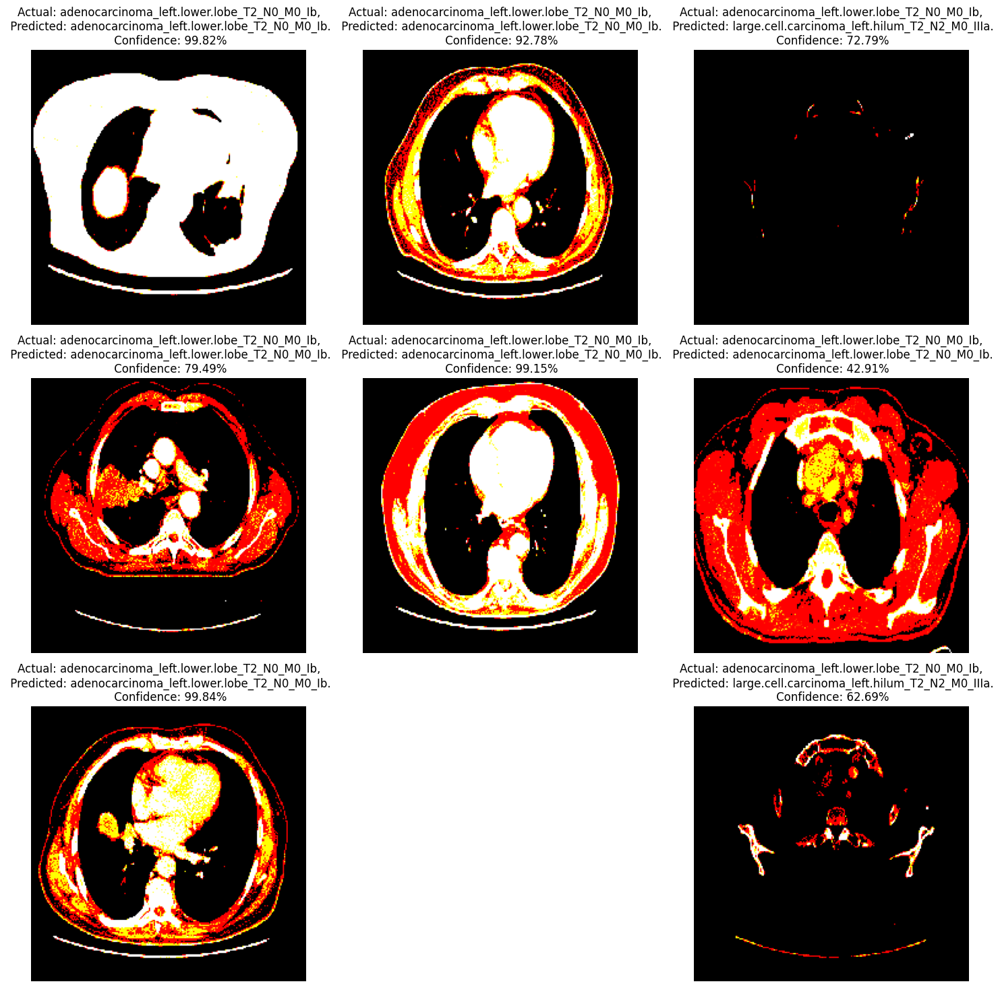

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# ResNet152

In [ ]:
from keras.applications import ResNet152
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelResNet152 = ResNet152(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelResNet152.layers:
    layer.trainable = False

234698864/234698864 [==============================] - 1s 0us/step


In [ ]:
model = Sequential([
    modelResNet152,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152 (Functional)      (None, 7, 7, 2048)        58370944  
                                                                 
 batch_normalization_4 (Bat  (None, 7, 7, 2048)        8192      
 chNormalization)                                                
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 3, 3, 2048)        0         
 g2D)                                                            
                                                                 
 dropout_16 (Dropout)        (None, 3, 3, 2048)        0         
                                                                 
 flatten_4 (Flatten)         (None, 18432)             0         
                                                                 
 dense_16 (Dense)            (None, 1024)             

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/resnet152.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)
test = test_generator
score = model.evaluate(test, verbose = 1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 4.0074 - accuracy: 0.3980
Epoch 1: val_accuracy improved from -inf to 0.38889, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet152.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 31s 1s/step - loss: 4.0074 - accuracy: 0.3980 - val_loss: 4.1728 - val_accuracy: 0.3889
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 2.1929 - accuracy: 0.5041
Epoch 2: val_accuracy improved from 0.38889 to 0.48611, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet152.h5
20/20 [==============================] - 18s 917ms/step - loss: 2.1929 - accuracy: 0.5041 - val_loss: 1.7466 - val_accuracy: 0.4861
Epoch 3/50
20/20 [==============================] - ETA: 0s - loss: 1.7935 - accuracy: 0.5057
Epoch 3: val_accuracy improved from 0.48611 to 0.52778, saving model to /content/drive/MyDrive/Minor_Project/Models/resnet152.h5
20/20 [==============================] - 29s 1s/step - loss: 1.7935 - accuracy: 0.5057 - val_loss: 1.0935 - val_accuracy: 0.5278
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.3043 - accuracy: 0.5693
Epoch 4: val_accuracy did not improve from 0.52778
20/20 [============

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 7s 302ms/step
              precision    recall  f1-score   support

           0       0.75      0.93      0.83       120
           1       0.88      0.88      0.88        51
           2       1.00      0.98      0.99        54
           3       0.94      0.64      0.76        90

    accuracy                           0.85       315
   macro avg       0.89      0.86      0.87       315
weighted avg       0.87      0.85      0.85       315





Confusion Matrix:
 [[112   5   0   3]
 [  5  45   0   1]
 [  1   0  53   0]
 [ 31   1   0  58]]


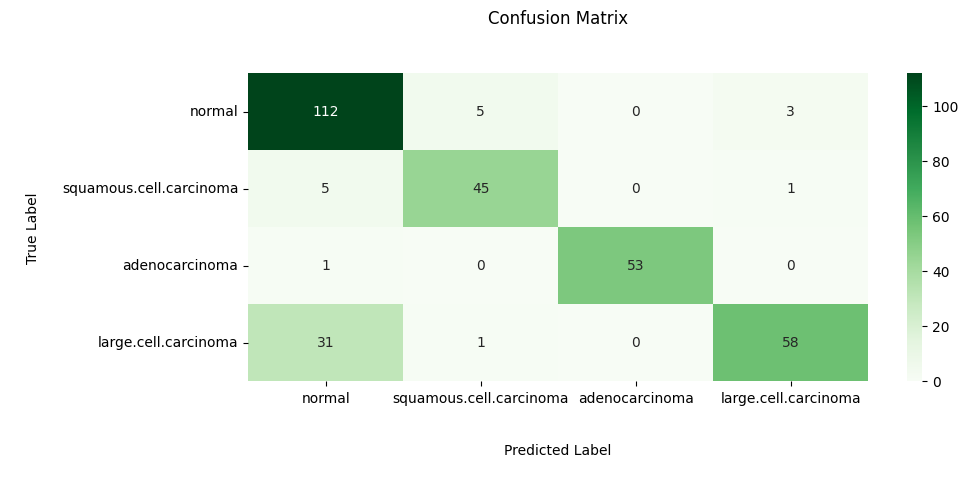

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

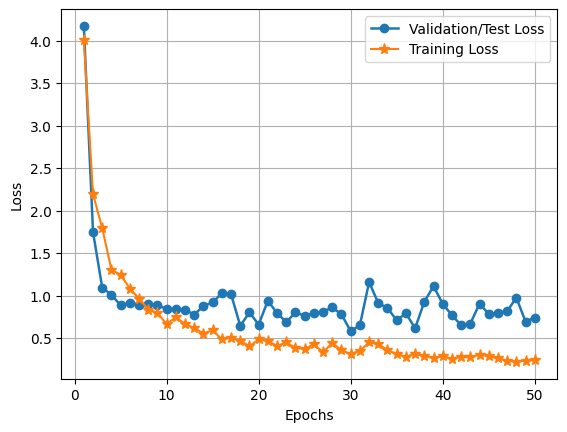

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

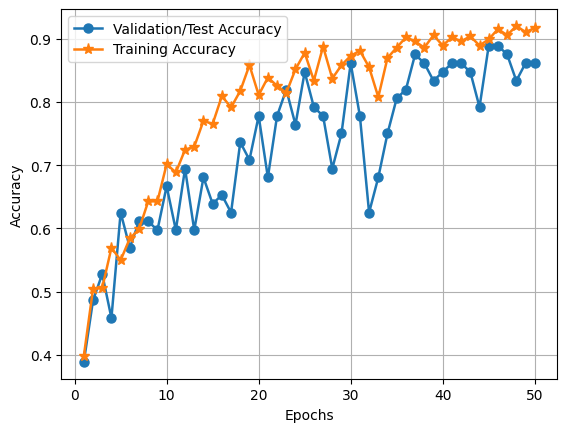

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/resnet152.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 4s 4s/step


1/1 [==============================] - 0s 71ms/step


1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 32ms/step


<ipython-input-21-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 33ms/step


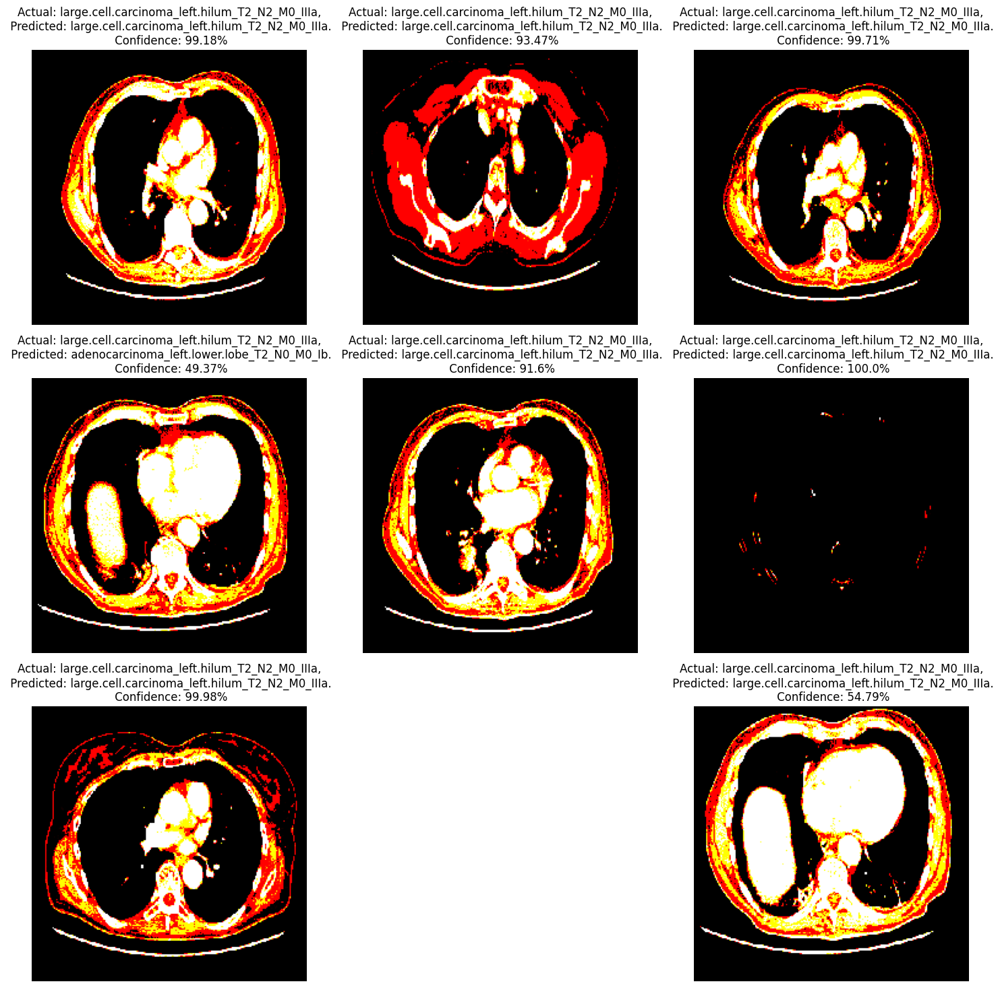

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# InceptionV3

In [ ]:
from keras.applications import InceptionV3  # Import InceptionV3
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelInceptionV3 = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelInceptionV3.layers:
    layer.trainable = False

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
model = Sequential([
    modelInceptionV3,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 batch_normalization_99 (Ba  (None, 5, 5, 2048)        8192      
 tchNormalization)                                               
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 2, 2, 2048)        0         
 g2D)                                                            
                                                                 
 dropout_20 (Dropout)        (None, 2, 2, 2048)        0         
                                                                 
 flatten_5 (Flatten)         (None, 8192)              0         
                                                                 
 dense_20 (Dense)            (None, 1024)             

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/inceptionv3.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)

# Evaluate the model on the test generator
score = model.evaluate(test_generator, verbose=1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 3.9565 - accuracy: 0.3458
Epoch 1: val_accuracy improved from -inf to 0.43056, saving model to /content/drive/MyDrive/Minor_Project/Models/inceptionv3.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 24s 771ms/step - loss: 3.9565 - accuracy: 0.3458 - val_loss: 3.6185 - val_accuracy: 0.4306
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 2.7486 - accuracy: 0.3687
Epoch 2: val_accuracy did not improve from 0.43056
20/20 [==============================] - 12s 611ms/step - loss: 2.7486 - accuracy: 0.3687 - val_loss: 1.9971 - val_accuracy: 0.4028
Epoch 3/50
20/20 [==============================] - ETA: 0s - loss: 2.0172 - accuracy: 0.4062
Epoch 3: val_accuracy did not improve from 0.43056
20/20 [==============================] - 13s 626ms/step - loss: 2.0172 - accuracy: 0.4062 - val_loss: 1.3936 - val_accuracy: 0.4306
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.8371 - accuracy: 0.4029
Epoch 4: val_accuracy did not improve from 0.43056
20/20 [==============================] - 14s 683ms/step - loss: 1.8371 - accuracy: 0.4029 - val_loss: 1.5530 - val_accuracy: 0.4306
Epoch 5/50
20/20 [===================

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 4s 231ms/step
              precision    recall  f1-score   support

           0       0.49      0.93      0.64       120
           1       0.67      0.27      0.39        51
           2       1.00      1.00      1.00        54
           3       0.83      0.11      0.20        90

    accuracy                           0.60       315
   macro avg       0.75      0.58      0.56       315
weighted avg       0.70      0.60      0.54       315





Confusion Matrix:
 [[112   7   0   1]
 [ 36  14   0   1]
 [  0   0  54   0]
 [ 80   0   0  10]]


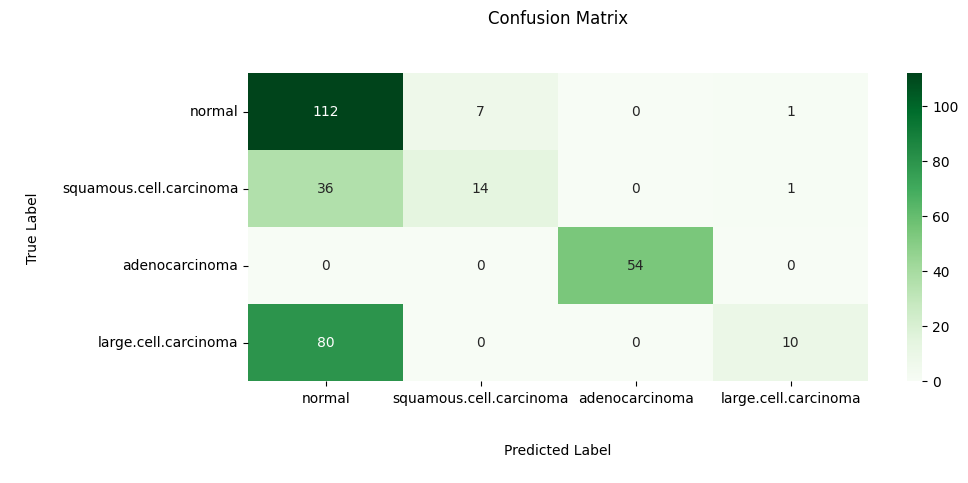

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

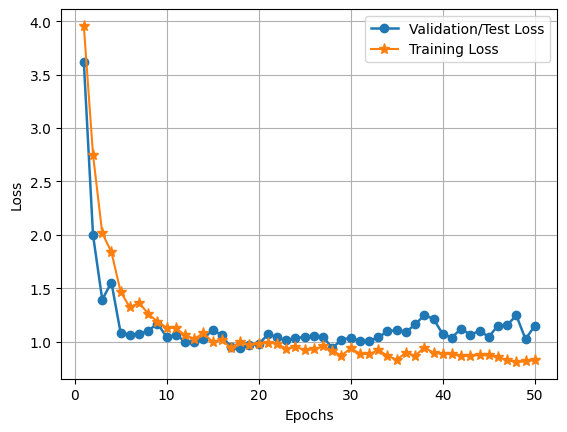

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

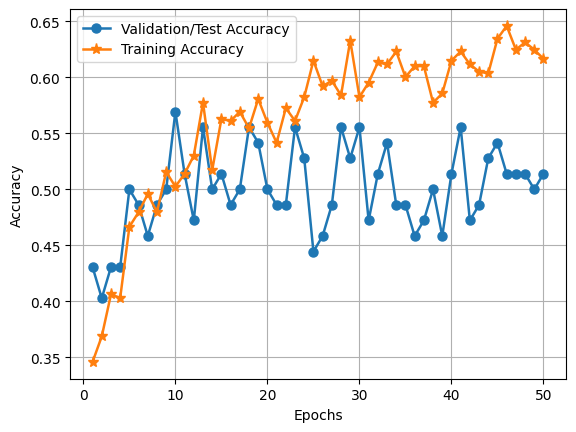

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/inceptionv3.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 38ms/step


<ipython-input-25-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 39ms/step


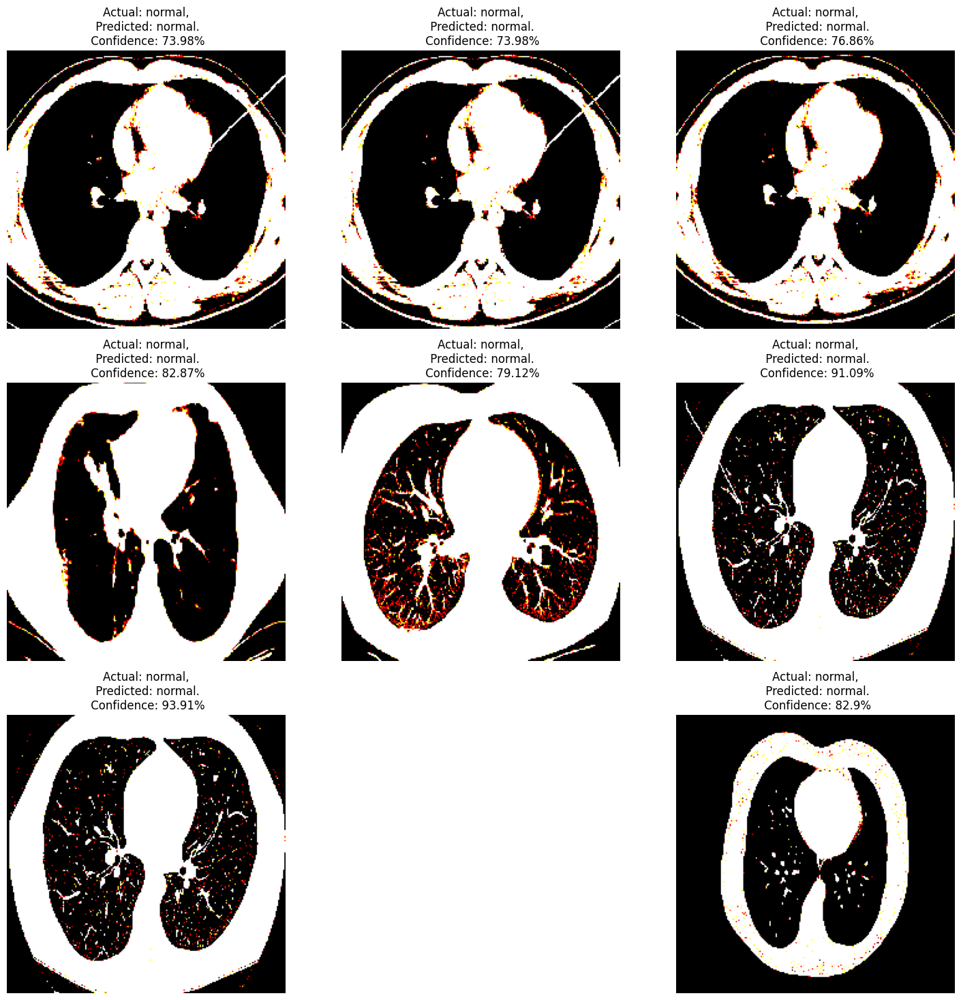

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# DenseNet

In [ ]:
from keras.applications import DenseNet121  # Import DenseNet121
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelDenseNet121 = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelDenseNet121.layers:
    layer.trainable = False

29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    modelDenseNet121,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 7, 7, 1024)        7037504   
                                                                 
 batch_normalization_304 (B  (None, 7, 7, 1024)        4096      
 atchNormalization)                                              
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 3, 3, 1024)        0         
 ng2D)                                                           
                                                                 
 dropout_28 (Dropout)        (None, 3, 3, 1024)        0         
                                                                 
 flatten_7 (Flatten)         (None, 9216)              0         
                                                                 
 dense_28 (Dense)            (None, 1024)             

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/densenet121.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)

# Evaluate the model on the test generator
score = model.evaluate(test_generator, verbose=1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 3.2527 - accuracy: 0.3785
Epoch 1: val_accuracy improved from -inf to 0.47222, saving model to /content/drive/MyDrive/Minor_Project/Models/densenet121.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 30s 1s/step - loss: 3.2527 - accuracy: 0.3785 - val_loss: 2.7180 - val_accuracy: 0.4722
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 1.8680 - accuracy: 0.4698
Epoch 2: val_accuracy did not improve from 0.47222
20/20 [==============================] - 14s 704ms/step - loss: 1.8680 - accuracy: 0.4698 - val_loss: 1.5831 - val_accuracy: 0.3472
Epoch 3/50
20/20 [==============================] - ETA: 0s - loss: 1.3680 - accuracy: 0.5090
Epoch 3: val_accuracy did not improve from 0.47222
20/20 [==============================] - 14s 733ms/step - loss: 1.3680 - accuracy: 0.5090 - val_loss: 1.1575 - val_accuracy: 0.4306
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.2584 - accuracy: 0.5237
Epoch 4: val_accuracy did not improve from 0.47222
20/20 [==============================] - 14s 745ms/step - loss: 1.2584 - accuracy: 0.5237 - val_loss: 1.4958 - val_accuracy: 0.4167
Epoch 5/50
20/20 [======================

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 6s 310ms/step
              precision    recall  f1-score   support

           0       0.60      0.83      0.69       120
           1       0.77      0.53      0.63        51
           2       0.93      0.98      0.95        54
           3       0.82      0.50      0.62        90

    accuracy                           0.71       315
   macro avg       0.78      0.71      0.72       315
weighted avg       0.74      0.71      0.71       315





Confusion Matrix:
 [[100   7   3  10]
 [ 24  27   0   0]
 [  1   0  53   0]
 [ 43   1   1  45]]


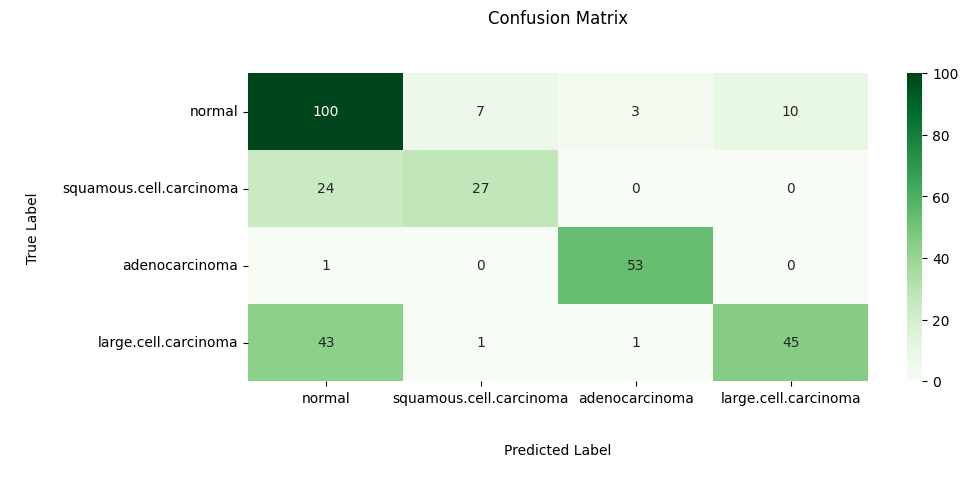

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

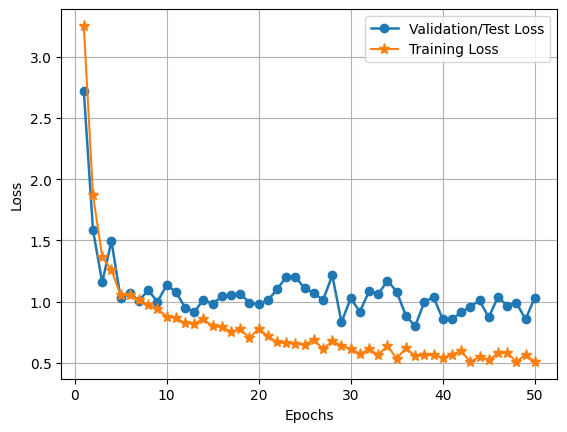

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

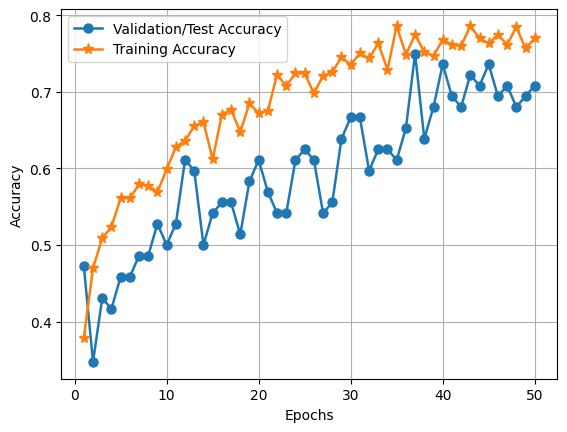

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/densenet121.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 72ms/step


1/1 [==============================] - 0s 122ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 65ms/step


1/1 [==============================] - 0s 51ms/step


<ipython-input-24-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 106ms/step


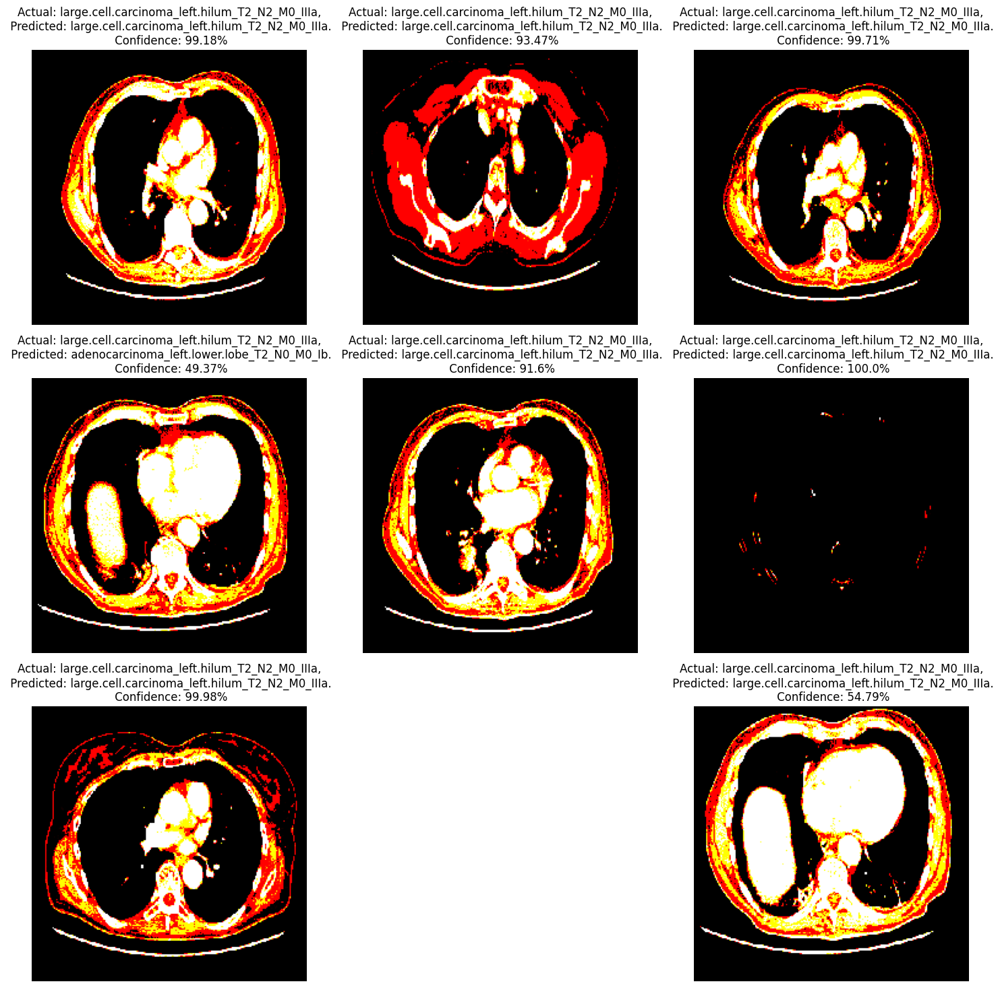

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# EfficientNet

In [ ]:
from keras.applications import EfficientNetB0  # Import EfficientNetB0
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelEfficientNetB0 = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelEfficientNetB0.layers:
    layer.trainable = False

16705208/16705208 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    modelEfficientNetB0,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 7, 7, 1280)        4049571   
 )                                                               
                                                                 
 batch_normalization_305 (B  (None, 7, 7, 1280)        5120      
 atchNormalization)                                              
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 3, 3, 1280)        0         
 ng2D)                                                           
                                                                 
 dropout_32 (Dropout)        (None, 3, 3, 1280)        0         
                                                                 
 flatten_8 (Flatten)         (None, 11520)             0         
                                                      

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/efficientnet_b0.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)

# Evaluate the model on the test generator
score = model.evaluate(test_generator, verbose=1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 3.1388 - accuracy: 0.3931
Epoch 1: val_accuracy improved from -inf to 0.43056, saving model to /content/drive/MyDrive/Minor_Project/Models/efficientnet_b0.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 27s 819ms/step - loss: 3.1388 - accuracy: 0.3931 - val_loss: 1.6688 - val_accuracy: 0.4306
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 2.1741 - accuracy: 0.4421
Epoch 2: val_accuracy did not improve from 0.43056
20/20 [==============================] - 14s 693ms/step - loss: 2.1741 - accuracy: 0.4421 - val_loss: 1.2674 - val_accuracy: 0.3611
Epoch 3/50
20/20 [==============================] - ETA: 0s - loss: 1.5134 - accuracy: 0.4584
Epoch 3: val_accuracy did not improve from 0.43056
20/20 [==============================] - 13s 671ms/step - loss: 1.5134 - accuracy: 0.4584 - val_loss: 1.1656 - val_accuracy: 0.3750
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.2749 - accuracy: 0.5465
Epoch 4: val_accuracy improved from 0.43056 to 0.50000, saving model to /content/drive/MyDrive/Minor_Project/Models/efficientnet_b0.h5
20/20 [==============================] - 17s 884ms/step - loss: 1.2749 - accuracy: 0.

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 4s 238ms/step
              precision    recall  f1-score   support

           0       0.59      0.92      0.72       120
           1       0.76      0.67      0.71        51
           2       1.00      0.94      0.97        54
           3       0.97      0.34      0.51        90

    accuracy                           0.72       315
   macro avg       0.83      0.72      0.73       315
weighted avg       0.79      0.72      0.70       315





Confusion Matrix:
 [[110   9   0   1]
 [ 17  34   0   0]
 [  3   0  51   0]
 [ 57   2   0  31]]


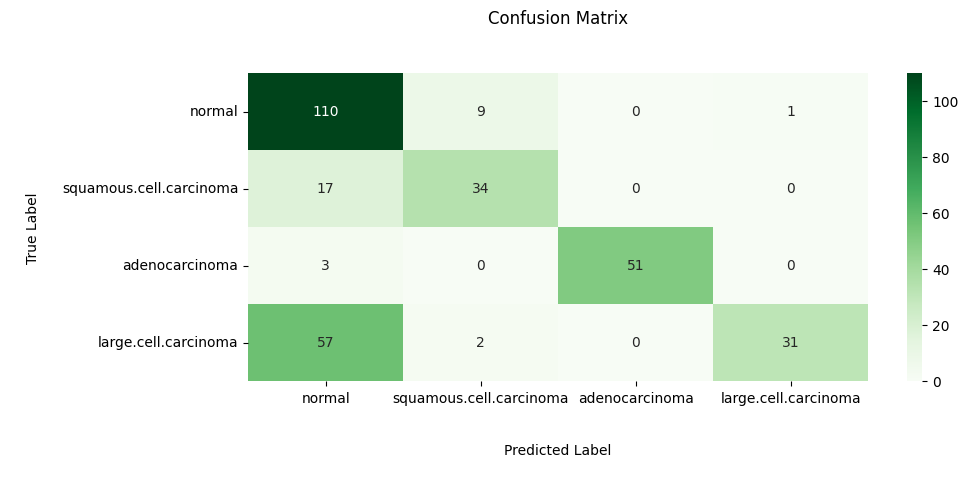

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

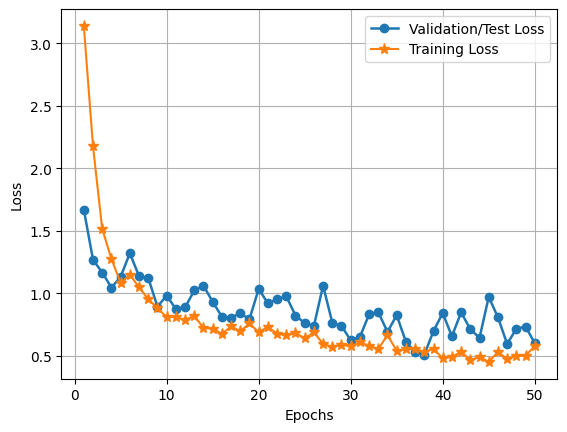

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

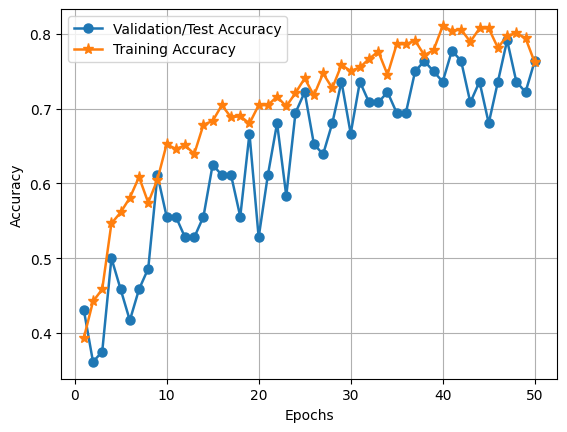

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/efficientnet_b0.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 27ms/step


<ipython-input-28-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 29ms/step


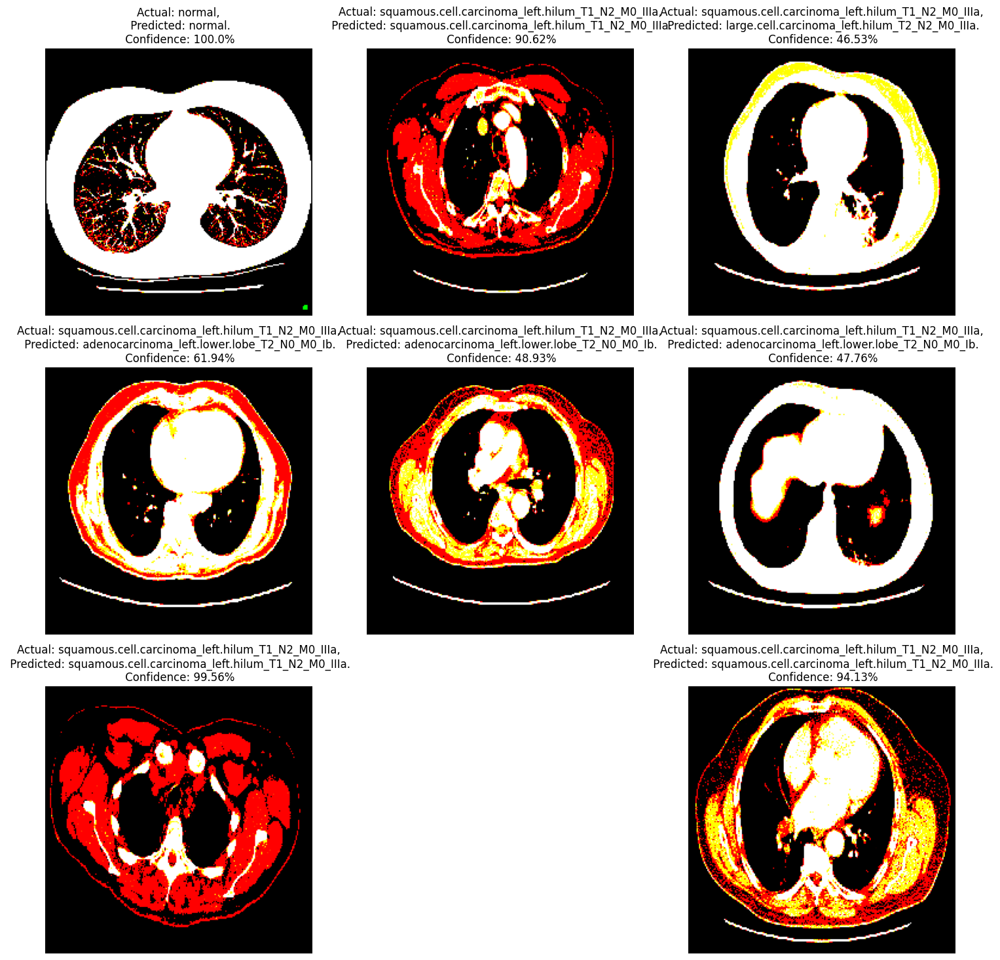

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# XCeption

In [ ]:
from keras.applications import Xception
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelXception = Xception(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelXception.layers:
    layer.trainable = False

83683744/83683744 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    modelXception,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 batch_normalization_310 (B  (None, 7, 7, 2048)        8192      
 atchNormalization)                                              
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 3, 3, 2048)        0         
 ng2D)                                                           
                                                                 
 dropout_36 (Dropout)        (None, 3, 3, 2048)        0         
                                                                 
 flatten_9 (Flatten)         (None, 18432)             0         
                                                                 
 dense_36 (Dense)            (None, 1024)             

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/xception.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)

# Evaluate the model on the test generator
score = model.evaluate(test_generator, verbose=1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 3.2877 - accuracy: 0.4029
Epoch 1: val_accuracy improved from -inf to 0.41667, saving model to /content/drive/MyDrive/Minor_Project/Models/xception.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 21s 814ms/step - loss: 3.2877 - accuracy: 0.4029 - val_loss: 3.0925 - val_accuracy: 0.4167
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 1.8581 - accuracy: 0.4421
Epoch 2: val_accuracy improved from 0.41667 to 0.45833, saving model to /content/drive/MyDrive/Minor_Project/Models/xception.h5
20/20 [==============================] - 19s 941ms/step - loss: 1.8581 - accuracy: 0.4421 - val_loss: 1.8769 - val_accuracy: 0.4583
Epoch 3/50
20/20 [==============================] - ETA: 0s - loss: 1.5850 - accuracy: 0.4861
Epoch 3: val_accuracy did not improve from 0.45833
20/20 [==============================] - 14s 712ms/step - loss: 1.5850 - accuracy: 0.4861 - val_loss: 2.2338 - val_accuracy: 0.3472
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.4194 - accuracy: 0.4584
Epoch 4: val_accuracy did not improve from 0.45833
20/20 [==============================] - 14s 678ms/step - loss: 1.4194 - accuracy: 0.4584 - 

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 4s 333ms/step
              precision    recall  f1-score   support

           0       0.51      0.93      0.66       120
           1       0.67      0.35      0.46        51
           2       0.98      0.96      0.97        54
           3       0.74      0.16      0.26        90

    accuracy                           0.62       315
   macro avg       0.72      0.60      0.59       315
weighted avg       0.68      0.62      0.57       315





Confusion Matrix:
 [[111   6   0   3]
 [ 31  18   0   2]
 [  2   0  52   0]
 [ 72   3   1  14]]


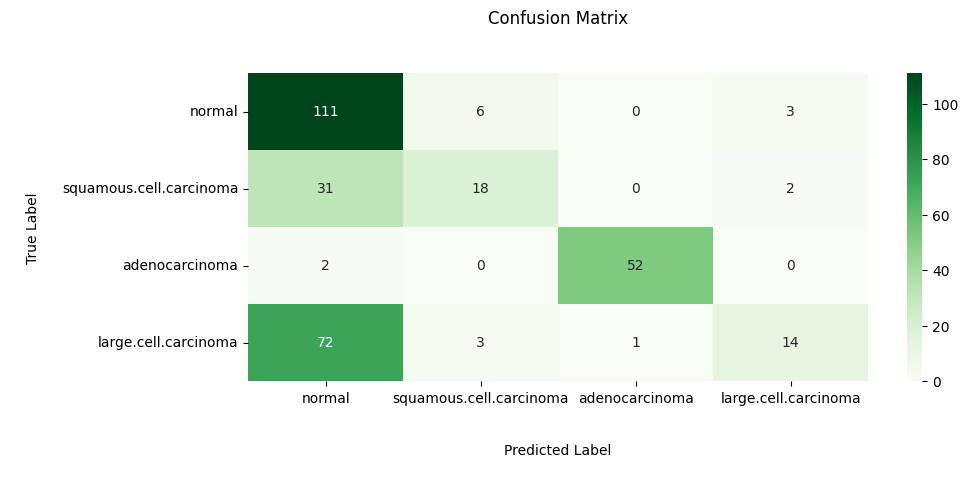

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

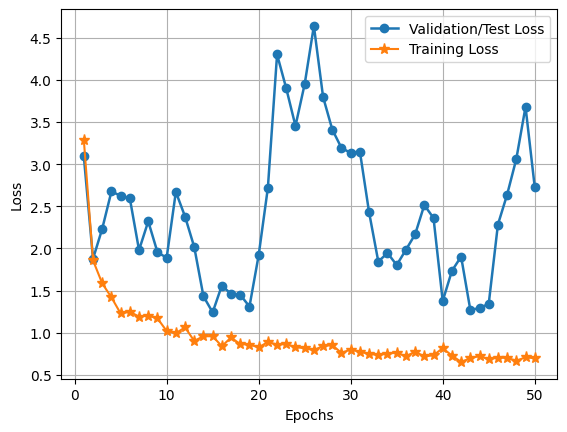

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

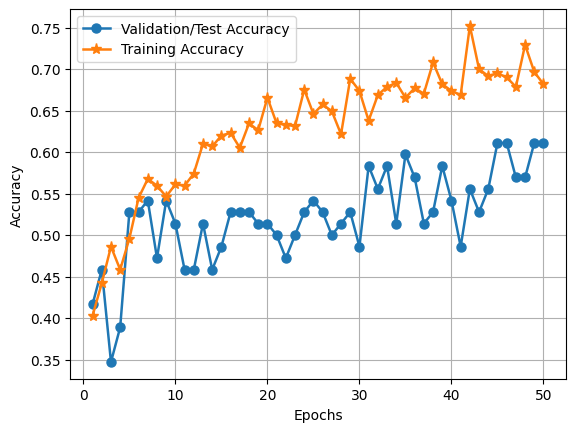

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/xception.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 1s 1s/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


<ipython-input-31-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 23ms/step


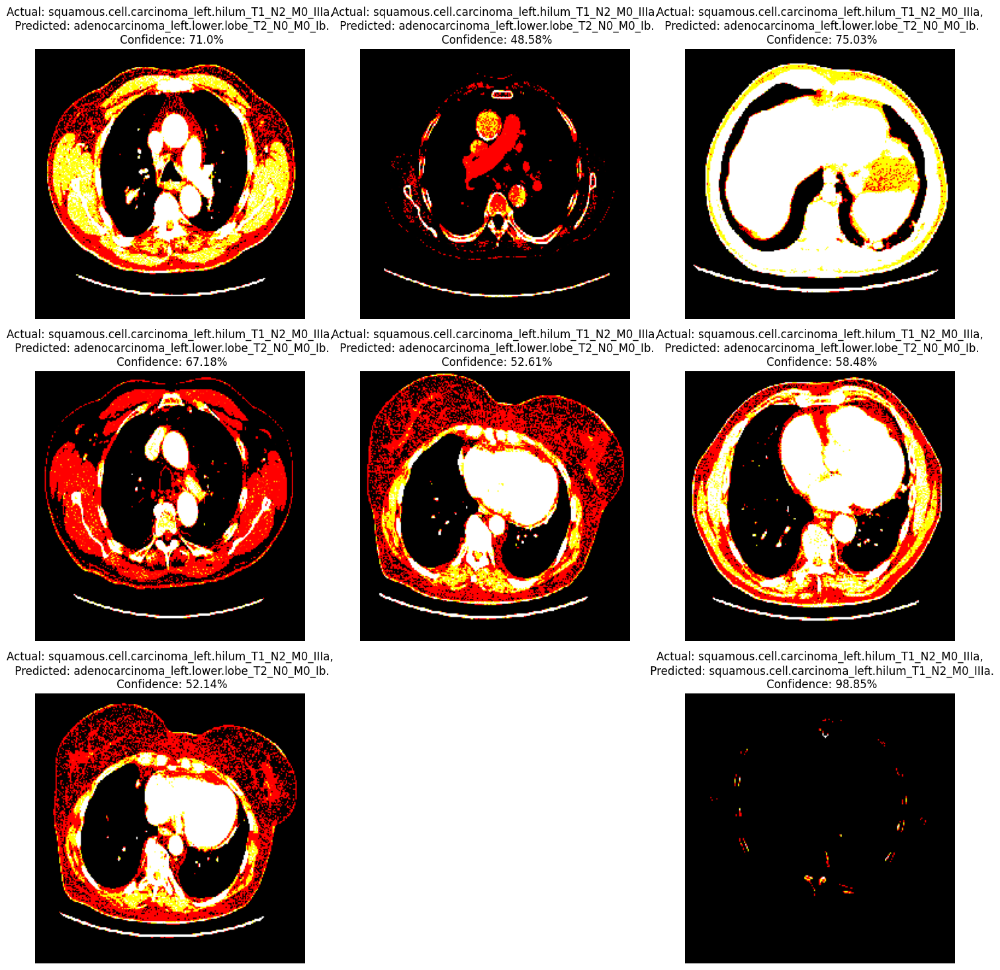

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

# MobileNetV2

In [ ]:
from keras.applications import MobileNetV2
from keras.models import Sequential
from keras.layers import BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

In [ ]:
modelMobileNetV2 = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the layers in the pre-trained model
for layer in modelMobileNetV2.layers:
    layer.trainable = False

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    modelMobileNetV2,
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.3),
    Dense(512, activation='relu'),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_class, activation='softmax')
])

# Display model summary
print(model.summary())

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 batch_normalization_311 (B  (None, 7, 7, 1280)        5120      
 atchNormalization)                                              
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 3, 3, 1280)        0         
 ng2D)                                                           
                                                                 
 dropout_40 (Dropout)        (None, 3, 3, 1280)        0         
                                                                 
 flatten_10 (Flatten)        (None, 11520)             0         
                                                     

In [ ]:
opt = Adam(learning_rate=0.001)
opt1 = RMSprop(learning_rate=0.001)

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

In [ ]:
checkpoint = ModelCheckpoint(filepath='/content/drive/MyDrive/Minor_Project/Models/mobilenetv2.h5',
                             monitor='val_accuracy',
                             mode='max',
                             save_best_only=True,
                             verbose=1)

earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=0.5,
                          patience=5,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',
                              factor=0.1,
                              patience=3,
                              verbose=1,
                              min_delta=0.8)

# Put the callbacks in a list
callbacks = [earlystop, reduce_lr]

In [ ]:
epochs = 50

# Train the model with training and validation generators
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs,
    verbose=1,
    callbacks=[checkpoint]
)

# Evaluate the model on the test generator
score = model.evaluate(test_generator, verbose=1)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Epoch 1/50
20/20 [==============================] - ETA: 0s - loss: 3.1289 - accuracy: 0.4241
Epoch 1: val_accuracy improved from -inf to 0.40278, saving model to /content/drive/MyDrive/Minor_Project/Models/mobilenetv2.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 19s 751ms/step - loss: 3.1289 - accuracy: 0.4241 - val_loss: 2.7238 - val_accuracy: 0.4028
Epoch 2/50
20/20 [==============================] - ETA: 0s - loss: 2.0771 - accuracy: 0.4731
Epoch 2: val_accuracy did not improve from 0.40278
20/20 [==============================] - 13s 673ms/step - loss: 2.0771 - accuracy: 0.4731 - val_loss: 1.9127 - val_accuracy: 0.3889
Epoch 3/50
20/20 [==============================] - ETA: 0s - loss: 1.7045 - accuracy: 0.4959
Epoch 3: val_accuracy improved from 0.40278 to 0.45833, saving model to /content/drive/MyDrive/Minor_Project/Models/mobilenetv2.h5
20/20 [==============================] - 16s 771ms/step - loss: 1.7045 - accuracy: 0.4959 - val_loss: 1.3453 - val_accuracy: 0.4583
Epoch 4/50
20/20 [==============================] - ETA: 0s - loss: 1.1062 - accuracy: 0.5840
Epoch 4: val_accuracy improved from 0.45833 to 0.48611, saving model to /content/drive/MyDrive/Minor_Project/Models/mobilenetv2.h5
20/20 [==

In [ ]:
num_test_samples = len(test_generator)
num_classes = len(test_generator.class_indices)

predicted_probabilities = model.predict(test_generator, steps=num_test_samples)
predicted_labels = np.argmax(predicted_probabilities, axis=1)

true_labels = test_generator.classes

report = classification_report(true_labels, predicted_labels)

print(report)

10/10 [==============================] - 3s 225ms/step
              precision    recall  f1-score   support

           0       0.67      0.73      0.70       120
           1       0.60      0.49      0.54        51
           2       0.96      0.98      0.97        54
           3       0.66      0.63      0.64        90

    accuracy                           0.71       315
   macro avg       0.72      0.71      0.71       315
weighted avg       0.70      0.71      0.70       315





Confusion Matrix:
 [[88 10  1 21]
 [17 25  0  9]
 [ 1  0 53  0]
 [25  7  1 57]]


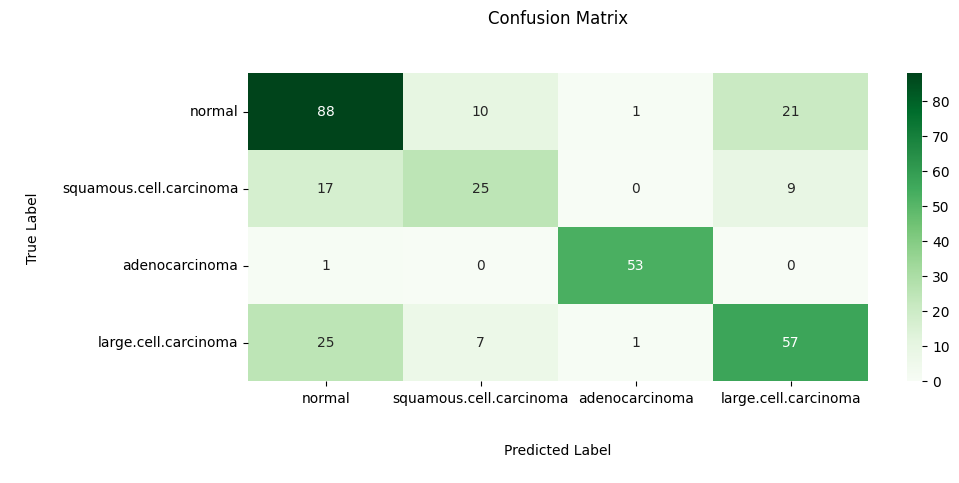

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print("\n\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels = test_c, yticklabels = test_c)
plt.xlabel('\n\nPredicted Label\n')
plt.ylabel('\nTrue Label\n')
plt.title('Confusion Matrix\n\n')
plt.show()

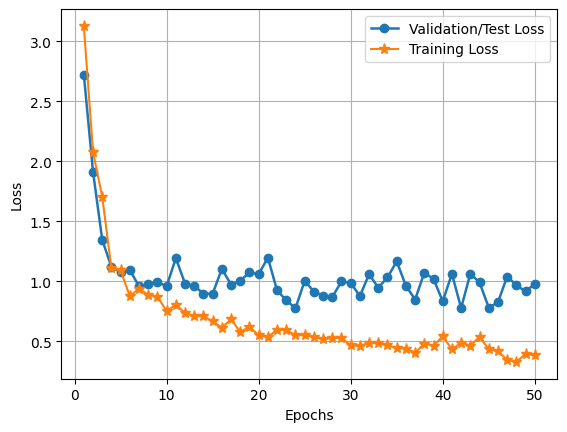

In [ ]:
#Plotting the loss charts

history_dict = history.history

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

line1 = plt.plot(epochs, val_loss_values, label = 'Validation/Test Loss')
line2 = plt.plot(epochs, loss_values, label = 'Training Loss')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.0)
plt.setp(line2, linewidth = 1.5, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

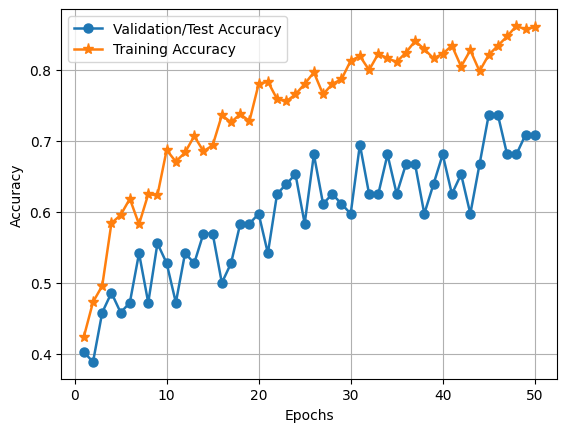

In [ ]:
#Plotting the accuracy charts

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)

line1 = plt.plot(epochs, val_acc_values, label = 'Validation/Test Accuracy')
line2 = plt.plot(epochs, acc_values, label = 'Training Accuracy')

plt.setp(line1, linewidth = 1.8, marker = 'o', markersize = 6.5)
plt.setp(line2, linewidth = 1.8, marker = '*', markersize = 8.0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class_names = list(train_generator.class_indices.keys())
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('/content/drive/MyDrive/Minor_Project/Models/mobilenetv2.h5')

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 33ms/step


<ipython-input-34-11c084a83987>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(3, 3, i + 1)


1/1 [==============================] - 0s 34ms/step


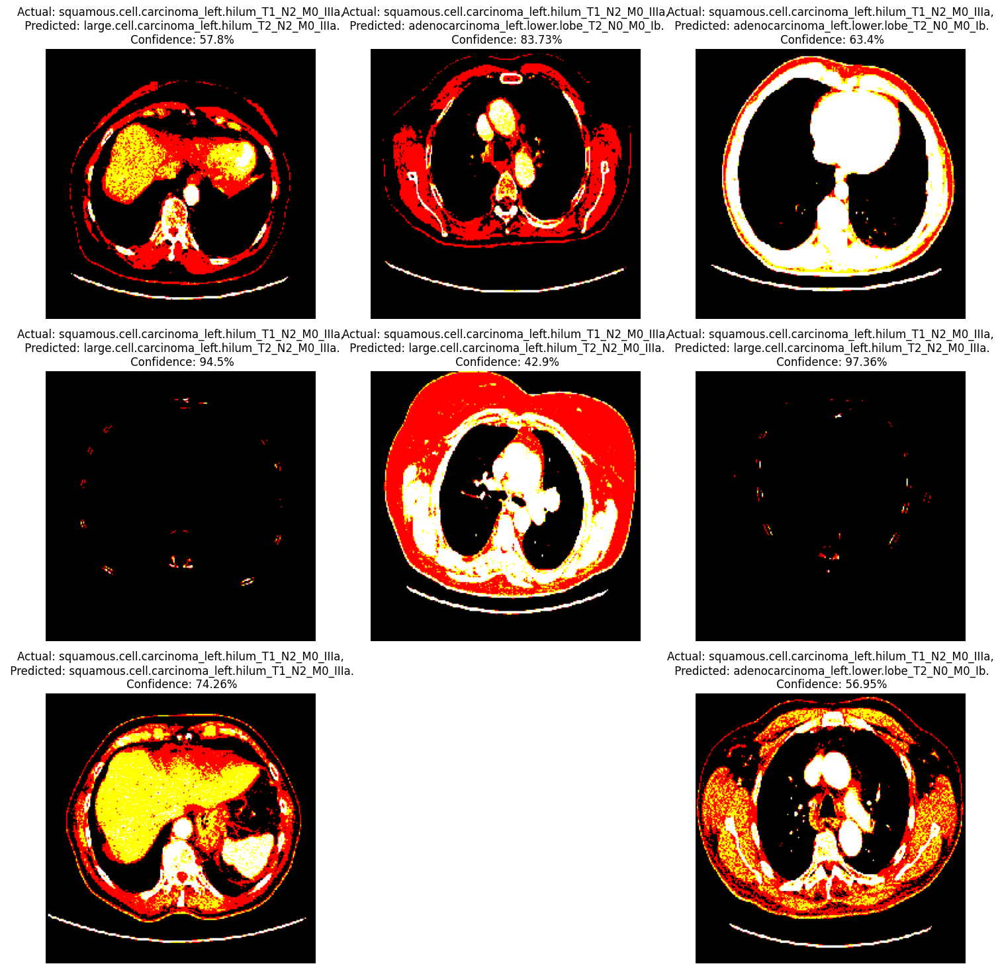

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 15))
for images, labels in test_generator:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        predicted_class, confidence = predict(model, images[i])
        actual_class = class_names[np.argmax(labels[i])]  # Access the index with np.argmax()

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.tight_layout()
        plt.axis("off")
    break

## Vision Transformer

In [ ]:
!pip install torch torchvision


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

class VisionTransformer(nn.Module):
    def __init__(self, img_size=224, patch_size=16, num_classes=4, dim=768, depth=12, heads=12, mlp_dim=3072, dropout=0.1):
        super(VisionTransformer, self).__init__()

        self.patch_size = patch_size
        self.num_patches = (img_size // patch_size) ** 2
        self.patch_dim = 3 * patch_size * patch_size
        self.dim = dim

        self.patch_embedding = nn.Linear(self.patch_dim, dim)
        self.position_embedding = nn.Parameter(torch.randn(1, self.num_patches + 1, dim))
        self.cls_token = nn.Parameter(torch.randn(1, 1, dim))

        self.transformer = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(dim, heads, mlp_dim, dropout), depth
        )

        self.mlp_head = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, num_classes)
        )

    def forward(self, x):
        batch_size = x.size(0)
        x = self.create_patches(x)
        x = self.patch_embedding(x)

        cls_tokens = self.cls_token.expand(batch_size, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x += self.position_embedding[:, :(x.size(1))]
        x = self.transformer(x)
        x = x[:, 0]
        return self.mlp_head(x)

    def create_patches(self, x):
        batch_size, channels, height, width = x.size()
        x = x.view(batch_size, channels, height // self.patch_size, self.patch_size, -1, self.patch_size)
        x = x.permute(0, 2, 4, 3, 5, 1).contiguous()
        x = x.view(batch_size, -1, self.patch_dim)
        return x


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from sklearn.metrics import classification_report, confusion_matrix
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torch.optim as optim

In [ ]:
# Hyperparameters
img_size = 224
patch_size = 16
num_classes = 4
dim = 768
depth = 12
heads = 12
mlp_dim = 3072
dropout = 0.1
batch_size = 32
learning_rate = 3e-4
epochs = 10

# Data directories
train_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/train"
valid_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/valid"
test_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/test"

In [ ]:
# Data preparation
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

train_dataset = datasets.ImageFolder(root=train_folder, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

valid_dataset = datasets.ImageFolder(root=valid_folder, transform=transform)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

test_dataset = datasets.ImageFolder(root=test_folder, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Model, loss function, and optimizer
model = VisionTransformer(img_size, patch_size, num_classes, dim, depth, heads, mlp_dim, dropout)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


VisionTransformer(
  (patch_embedding): Linear(in_features=768, out_features=768, bias=True)
  (transformer): TransformerEncoder(
    (layers): ModuleList(
      (0-11): 12 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (linear1): Linear(in_features=768, out_features=3072, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=3072, out_features=768, bias=True)
        (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (mlp_head): Sequential(
    (0): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (1): Linear(in_features=768, out_features=4, bias=True)
  )
)

In [ ]:
train_losses = []
valid_losses = []
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if batch_idx % 100 == 0:
            print(f'Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)}] Loss: {loss.item():.6f}')

    train_losses.append(running_loss / len(train_loader))

    # Validation
    model.eval()
    valid_loss = 0.0
    with torch.no_grad():
        for data, target in valid_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            valid_loss += loss.item()
    valid_losses.append(valid_loss / len(valid_loader))

    print(f'Epoch: {epoch} Training Loss: {train_losses[-1]:.6f}, Validation Loss: {valid_losses[-1]:.6f}')

# Save the model
torch.save(model.state_dict(), '/content/drive/MyDrive/Minor_Project/Models/vit_model.pth')


Epoch: 0 [0/613] Loss: 1.361226
Epoch: 0 Training Loss: 2.026777, Validation Loss: 1.902421
Epoch: 1 [0/613] Loss: 1.887756
Epoch: 1 Training Loss: 1.469175, Validation Loss: 1.476247
Epoch: 2 [0/613] Loss: 1.443072
Epoch: 2 Training Loss: 1.405190, Validation Loss: 1.605329
Epoch: 3 [0/613] Loss: 1.412318
Epoch: 3 Training Loss: 1.410234, Validation Loss: 1.461513
Epoch: 4 [0/613] Loss: 1.402936
Epoch: 4 Training Loss: 1.480346, Validation Loss: 1.407187
Epoch: 5 [0/613] Loss: 1.281958
Epoch: 5 Training Loss: 1.403372, Validation Loss: 1.488823
Epoch: 6 Training Loss: 1.405836, Validation Loss: 1.434097
Epoch: 7 [0/613] Loss: 1.317469
Epoch: 7 Training Loss: 1.402736, Validation Loss: 1.448714
Epoch: 8 [0/613] Loss: 1.353638
Epoch: 8 Training Loss: 1.421740, Validation Loss: 1.583725
Epoch: 9 [0/613] Loss: 1.288065
Epoch: 9 Training Loss: 1.419222, Validation Loss: 1.380555


In [ ]:
# Evaluation
model.eval()
all_preds = []
all_targets = []
with torch.no_grad():
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        preds = output.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(target.cpu().numpy())

# Classification report and confusion matrix
print(classification_report(all_targets, all_preds, target_names=test_dataset.classes))

cm = confusion_matrix(all_targets, all_preds)
print("\nConfusion Matrix:\n", cm)

In [ ]:
plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Plotting the loss charts
epochs_range = range(1, epochs + 1)

plt.figure()
plt.plot(epochs_range, train_losses, label='Training Loss')
plt.plot(epochs_range, valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
# Inference on test images
model.load_state_dict(torch.load('/content/drive/MyDrive/Minor_Project/Models/vit_model.pth'))

def predict(model, img):
    img = img.unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        output = model(img)
    predicted_class = output.argmax(dim=1).item()
    confidence = torch.max(F.softmax(output, dim=1)).item() * 100
    return predicted_class, confidence

plt.figure(figsize=(15, 15))
for data, _ in test_loader:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        img = data[i]
        predicted_class, confidence = predict(model, img)
        actual_class = test_dataset.classes[_.numpy()[i]]

        plt.imshow(img.permute(1, 2, 0))
        plt.title(f"Actual: {actual_class},\n Predicted: {test_dataset.classes[predicted_class]}\n Confidence: {confidence:.2f}%")
        plt.axis("off")
    break
plt.show()

In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 13.7 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import timm
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Hyperparameters
img_size = 224
patch_size = 16
num_classes = 4  # Change this based on your dataset
dim = 768
depth = 12
heads = 12
mlp_dim = 3072
dropout = 0.1
batch_size = 32
learning_rate = 3e-4
epochs = 10

# Data preparation with normalization
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),  # Data augmentation
    transforms.RandomRotation(10),  # Data augmentation
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # Normalization
])

train_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/train"
valid_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/valid"
test_folder = "/content/drive/MyDrive/Minor_Project/CT_Scan_Data/test"

train_dataset = datasets.ImageFolder(root=train_folder, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

valid_dataset = datasets.ImageFolder(root=valid_folder, transform=transform)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

test_dataset = datasets.ImageFolder(root=test_folder, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Load pretrained Vision Transformer
model = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=num_classes)

# Modify the last layer to match the number of classes
model.head = nn.Linear(model.head.in_features, num_classes)

# Model, loss function, and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=0.01)

# Learning rate scheduler
scheduler = StepLR(optimizer, step_size=7, gamma=0.1)

# Training loop
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

train_losses = []
valid_losses = []
best_accuracy = 0

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if batch_idx % 100 == 0:
            print(f'Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)}] Loss: {loss.item():.6f}')

    train_losses.append(running_loss / len(train_loader))

    # Validation
    model.eval()
    valid_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for data, target in valid_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            valid_loss += loss.item()
            preds = output.argmax(dim=1)
            correct += preds.eq(target).sum().item()
            total += target.size(0)

    valid_accuracy = correct / total
    valid_losses.append(valid_loss / len(valid_loader))

    print(f'Epoch: {epoch} Training Loss: {train_losses[-1]:.6f}, Validation Loss: {valid_losses[-1]:.6f}, Validation Accuracy: {valid_accuracy:.2f}')

    # Save the best model
    if valid_accuracy > best_accuracy:
        best_accuracy = valid_accuracy
        torch.save(model.state_dict(), '/content/drive/MyDrive/Minor_Project/Models/vit_model.pth')

    # Step the scheduler
    scheduler.step()



/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch: 0 [0/613] Loss: 2.992353
Epoch: 0 Training Loss: 1.572602, Validation Loss: 1.007728, Validation Accuracy: 0.38
Epoch: 1 [0/613] Loss: 0.857127
Epoch: 1 Training Loss: 1.048993, Validation Loss: 0.980784, Validation Accuracy: 0.38
Epoch: 2 [0/613] Loss: 1.183318
Epoch: 2 Training Loss: 0.944861, Validation Loss: 0.996133, Validation Accuracy: 0.50
Epoch: 3 [0/613] Loss: 0.949691
Epoch: 3 Training Loss: 0.975050, Validation Loss: 1.204097, Validation Accuracy: 0.47
Epoch: 4 [0/613] Loss: 1.096040
Epoch: 4 Training Loss: 0.979149, Validation Loss: 1.104808, Validation Accuracy: 0.49
Epoch: 5 [0/613] Loss: 0.911936
Epoch: 5 Training Loss: 0.961563, Validation Loss: 1.180319, Validation Accuracy: 0.46
Epoch: 6 [0/613] Loss: 0.829818
Epoch: 6 Training Loss: 0.910064, Validation Loss: 1.018206, Validation Accuracy: 0.50
Epoch: 7 [0/613] Loss: 0.987147
Epoch: 7 Training Loss: 0.853249, Validation Loss: 1.136385, Validation Accuracy: 0.47
Epoch: 8 [0/613] Loss: 0.937389
Epoch: 8 Trainin

KeyboardInterrupt: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                         precision    recall  f1-score   support

         adenocarcinoma       0.49      0.62      0.55       120
   large.cell.carcinoma       0.00      0.00      0.00        51
                 normal       1.00      1.00      1.00        54
squamous.cell.carcinoma       0.35      0.42      0.38        90

               accuracy                           0.53       315
              macro avg       0.46      0.51      0.48       315
           weighted avg       0.46      0.53      0.49       315


Confusion Matrix:
 [[75  0  0 45]
 [25  0  0 26]
 [ 0  0 54  0]
 [52  0  0 38]]


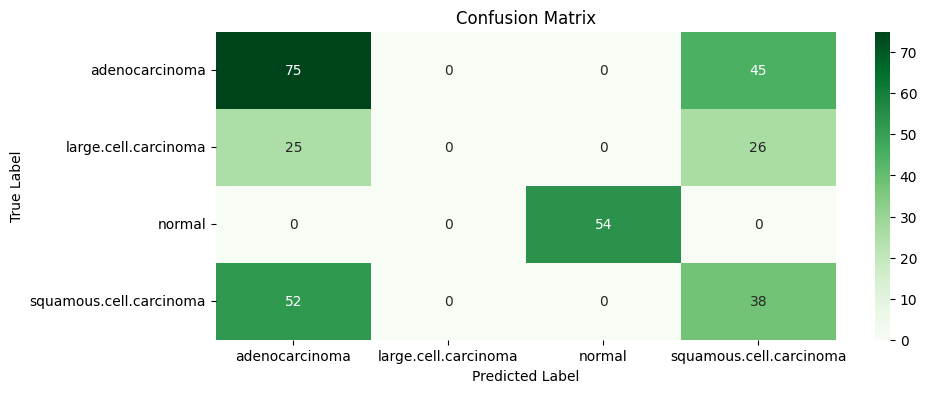

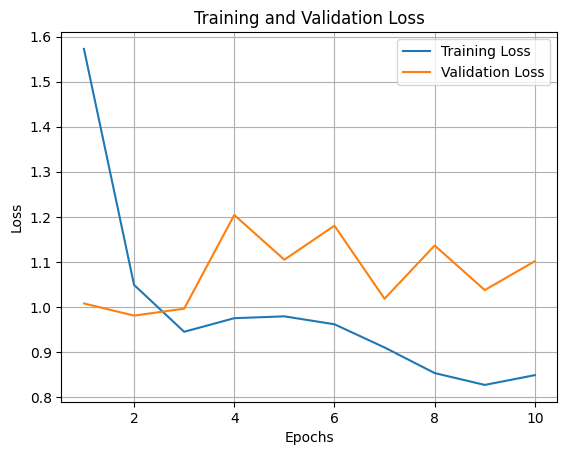

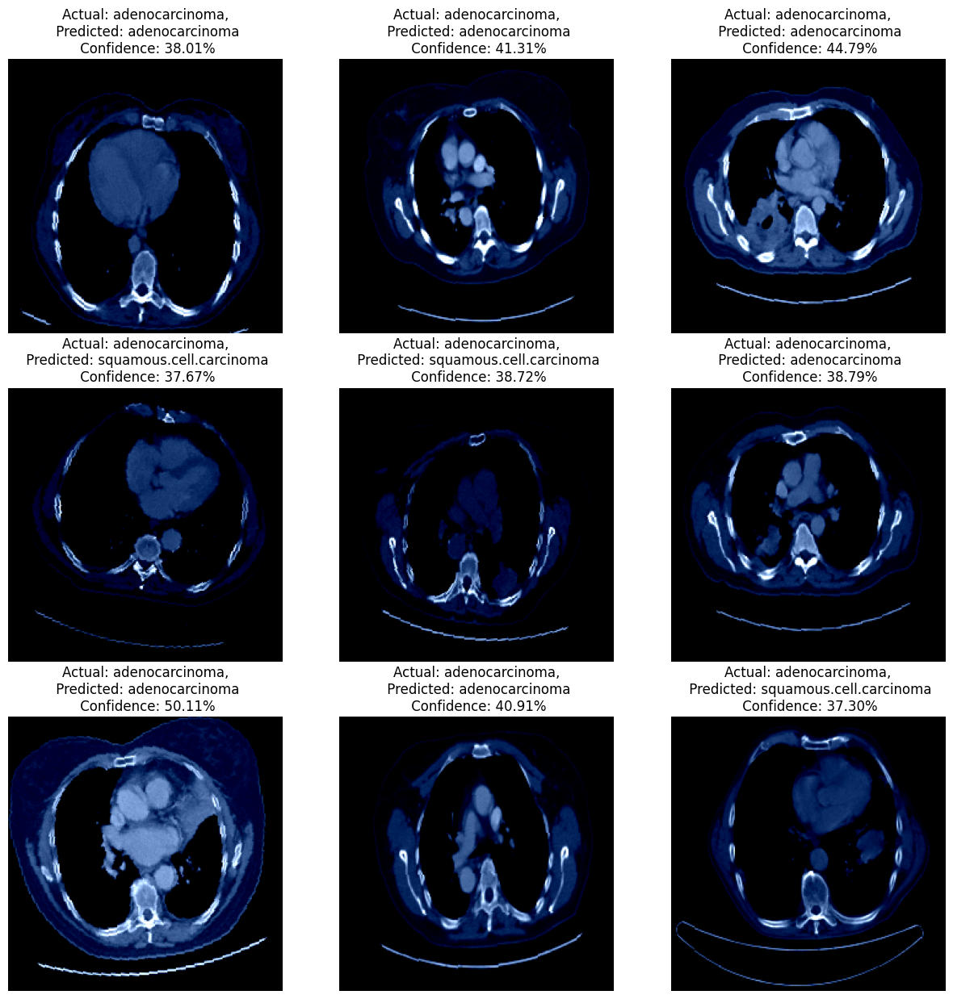

In [ ]:
# Load the best model
model.load_state_dict(torch.load('/content/drive/MyDrive/Minor_Project/Models/vit_model.pth'))

# Evaluation
model.eval()
all_preds = []
all_targets = []
with torch.no_grad():
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        preds = output.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(target.cpu().numpy())

# Classification report and confusion matrix
print(classification_report(all_targets, all_preds, target_names=test_dataset.classes))

cm = confusion_matrix(all_targets, all_preds)
print("\nConfusion Matrix:\n", cm)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens', xticklabels=test_dataset.classes, yticklabels=test_dataset.classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Plotting the loss charts
epochs_range = range(1, epochs + 1)

plt.figure()
plt.plot(epochs_range, train_losses, label='Training Loss')
plt.plot(epochs_range, valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.title('Training and Validation Loss')
plt.show()

# Inference on test images
def predict(model, img):
    model.eval()
    img = img.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(img)
    predicted_class = output.argmax(dim=1).item()
    confidence = torch.max(F.softmax(output, dim=1)).item() * 100
    return predicted_class, confidence

plt.figure(figsize=(15, 15))
for data, _ in test_loader:
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        img = data[i]
        predicted_class, confidence = predict(model, img)
        actual_class = test_dataset.classes[_.numpy()[i]]

        plt.imshow(img.permute(1, 2, 0).cpu())
        plt.title(f"Actual: {actual_class},\n Predicted: {test_dataset.classes[predicted_class]}\n Confidence: {confidence:.2f}%")
        plt.axis("off")
    break
plt.show()
